# 데이콘 이상탐지 데이터 분석
---

In [1]:
!pip install --upgrade matplotlib

  Obtaining dependency information for matplotlib from https://files.pythonhosted.org/packages/e9/18/80f70d91896e0a517b4a051c3fd540daa131630fd75e02e250365353b253/matplotlib-3.9.4-cp311-cp311-macosx_11_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 4.7 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.9.3
    Uninstalling matplotlib-3.9.3:
      Successfully uninstalled matplotlib-3.9.3


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt
import pywt

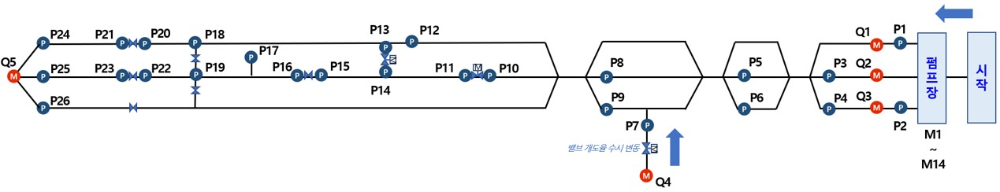

In [3]:
#밸브 개도율 압력계: p7, p10,p11,p13,p14,p15,p16,p18,p19,p20,p21,p22,p23

# M7펌프가 24/06/26 05:58 1에서 0으로 변함
# 압력계가 비정상이되면 14:20-부터 급격히 떨어지다가 정상화된 14:50부터 다시 올라감
- P가 anomaly 관측에 주요 변수로 보임(P8)
- 밸브 개도율 수시 변동과 p8 p9 사이 상관관계 가능
- Q4는 굉장히 중요한 변수다
- Q5가 완전 음에서 완전 양으로 바뀐다
- p7하고 q4가 상관관계 -1에 가까워 q4와 p7사이에 밸브는 개도율이 수시로 변동한다 
- p7이 압력이 높아졌을 때 밸브를 닫아서 q4의 유량이 감소했을 가능성이 있음
- 베르누이 원리에 의해서 정상상태에서는 유량과 압력이 음의 상관관계다
- 근데 anomaly상황에서 q5에서 양의 상관관계다
Anomaly 상황에서 유량과 압력이 양의 상관관계를 보이는 것은 시스템에 비정상적인 상태가 발생했음을 시사합니다. 이는 다음과 같은 상황을 나타낼 수 있습니다:
누수 발생: 파이프라인에 누수가 발생하면, 압력이 증가함에 따라 누수 지점을 통한 유량도 증가할 수 있습니다2. 이는 정상적인 흐름과는 다른 패턴을 보이게 됩니다.
막힘 현상: 파이프라인에 부분적인 막힘이 발생하면, 압력이 증가하면서 동시에 유량도 증가할 수 있습니다. 이는 막힘을 통과하기 위해 더 높은 압력이 필요하기 때문입니다2.
펌프 오작동: 시스템 내 펌프가 비정상적으로 작동하면, 압력과 유량이 동시에 증가하는 현상이 나타날 수 있습니다3.
밸브 오작동: 제어 밸브가 제대로 작동하지 않으면, 압력과 유량 사이의 정상적인 관계가 무너질 수 있습니다.
결론
이러한 관찰 결과는 시스템의 정상 상태와 비정상 상태를 구분하는 중요한 지표가 될 수 있습니다4. 유량과 압력 사이의 관계가 갑자기 변화하는 것은 시스템에 문제가 발생했음을 나타내는 신호일 수 있으며, 이를 통해 조기에 문제를 감지하고 대응할 수 있습니다. 따라서 이러한 패턴 변화를 모니터링하는 것은 수도 공급 시스템의 효율적인 관리와 유지보수에 매우 중요합니다5.

## 이미지 분석과 수압 데이터의 특성을 고려할 때, 다음과 같은 도메인 기반 전처리 방법들을 제안합니다:
1. 시간 도메인 전처리
- Moving Average Filter
세 번째 이미지에서 보이는 급격한 압력 변화 전후의 노이즈 제거
단기(5-10점) 및 장기(20-30점) 이동평균 비교로 변화 패턴 강조
- Exponential Smoothing
최근 데이터에 더 높은 가중치 부여
P8, P9의 급격한 하락 구간 전후의 패턴 포착에 효과적
2. 주파수 도메인 전처리
- Butterworth Filter
Low-pass filter로 고주파 노이즈 제거
압력 변화의 주요 패턴만 추출
차단 주파수: 0.1-0.2Hz 권장
- Wavelet Transform
다중 해상도 분석으로 급격한 압력 변화 감지
Daubechies 웨이블릿 사용 권장
레벨 3-4 분해로 이상 패턴 특성 추출
3. 압력 특성 기반 전처리
- Pressure Gradient Analysis
압력 변화율 계산 및 임계값 설정
급격한 하락 구간 감지에 효과적
- Differential Pressure
인접 압력계 간의 차이 분석
P7-P9 그룹 내 상대적 변화 패턴 포착
4. 통계적 전처리
- Z-score Normalization
압력 변동의 통계적 이상치 감지
이동 윈도우 기반 정규화로 지역적 변화 강조
- CUSUM (Cumulative Sum)
누적 편차 분석으로 변화 시점 탐지
압력 하락 시작점 감지에 효과적
이러한 전처리 방법들을 조합하여 두 번째 이미지의 LOF 성능을 개선할 수 있습니다.

## 이미지 분석 결과를 보면, 각 전처리 방법의 특징이 다음과 같이 나타납니다:
1. Butterworth 필터 적용 (주황색 그래프)
원본 신호의 고주파 노이즈를 효과적으로 제거
P8, P9의 급격한 하락 패턴은 유지하면서 부드러운 신호를 생성
세 번째 이미지의 anomaly 구간(빨간색 영역)의 특성을 잘 보존
2. EMA (녹색 그래프)
이동평균으로 단기적인 변동성 감소
압력 변화의 전반적인 트렌드를 잘 포착
급격한 하락 구간에서도 원신호의 특성을 유지
3. Gradient (빨간색 그래프)
압력 변화율을 명확하게 표시
anomaly 구간에서 큰 음수값으로 급격한 하락을 강조
정상 구간과 이상 구간의 차이가 뚜렷하게 나타남
이러한 전처리된 특성들은 LOF 모델의 입력으로 사용되어 P8, P9의 anomaly 탐지 성능을 개선할 수 있습니다.

# 데이터 정보

In [5]:
df_A = pd.read_csv("/Users/gimjaeheon/Desktop/k-water2/open/train/TRAIN_A.csv")

print(df_A.columns)
print("칼럼 수 : ",len(df_A.columns))
print("차원 : ",df_A.shape)


# 새로운 열 생성: Q5 - (Q1 + Q2 + Q3 + Q4)
df_A['leakage'] = df_A['Q1'] + df_A['Q2'] + df_A['Q3'] + df_A['Q4'] - df_A['Q5']

Index(['timestamp', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'M1', 'M2', 'M3', 'M4', 'M5',
       'M6', 'M7', 'M8', 'M9', 'M10', 'M11', 'M12', 'M13', 'M14', 'P1', 'P2',
       'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13',
       'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23',
       'P24', 'P25', 'P26', 'anomaly', 'P1_flag', 'P2_flag', 'P3_flag',
       'P4_flag', 'P5_flag', 'P6_flag', 'P7_flag', 'P8_flag', 'P9_flag',
       'P10_flag', 'P11_flag', 'P12_flag', 'P13_flag', 'P14_flag', 'P15_flag',
       'P16_flag', 'P17_flag', 'P18_flag', 'P19_flag', 'P20_flag', 'P21_flag',
       'P22_flag', 'P23_flag', 'P24_flag', 'P25_flag', 'P26_flag'],
      dtype='object')
칼럼 수 :  73
차원 :  (44101, 73)


In [6]:
# 압력계 데이터 선택
pressure_cols = [f'P{i}' for i in range(1, 27)]
df_pressure = df_A[pressure_cols]

In [7]:
# 1. Butterworth 저역통과 필터 적용
#cutoff 주파수 선택이 중요
#너무 낮으면 중요한 변화까지 제거하고 너무 높으면 노이즈가 남음
#필터 차수(order)조정 필요
#높으면 더 급격한 차단특성, 낮은 차수는 더 부드러운 필터링
# 1. Butterworth 필터 적용
def apply_butterworth(data, cutoff=0.1, fs=1.0, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, data)

In [8]:
# 2. Exponential Moving Average with Pressure Gradient
def apply_exp_ma_with_gradient(data, alpha=0.1):
    ema = data.ewm(alpha=alpha).mean()
    gradient = np.gradient(ema)
    return ema, gradient

In [9]:
def apply_wavelet_transform(data, wavelet='db4', level=3):
    # 웨이블렛 분해
    coeffs = pywt.wavedec(data, wavelet, level=level)
    # 근사값(cA)과 상세값(cD) 추출
    cA = coeffs[0]
    cD = coeffs[1:]
    
    # 원본 길이에 맞춰 재구성
    reconstructed = pywt.waverec(coeffs, wavelet)
    
    # 원본 데이터 길이에 맞추기
    if len(reconstructed) > len(data):
        reconstructed = reconstructed[:len(data)]
    elif len(reconstructed) < len(data):
        # 부족한 부분을 0으로 패딩
        padding = np.zeros(len(data) - len(reconstructed))
        reconstructed = np.concatenate([reconstructed, padding])
    
    return reconstructed, cA


In [10]:
# 전처리 적용
df_butter = pd.DataFrame(index=df_pressure.index)
df_ema = pd.DataFrame(index=df_pressure.index)
df_gradient = pd.DataFrame(index=df_pressure.index)
df_wavelet = pd.DataFrame(index=df_pressure.index)

In [11]:
for col in pressure_cols:
    # Butterworth 필터 적용
    df_butter[col] = apply_butterworth(df_pressure[col].values)
    # EMA와 Gradient 적용
    ema, grad = apply_exp_ma_with_gradient(df_pressure[col])
    df_ema[col] = ema
    df_gradient[col] = grad
    # 웨이블렛 변환 적용
    wavelet_rec, _ = apply_wavelet_transform(df_pressure[col].values)
    df_wavelet[col] = wavelet_rec[:len(df_pressure)]

In [13]:
# 시각화
# 시각화 함수 수정
def plot_preprocessing_comparison(original, butter, ema, gradient, wavelet, col):
    plt.figure(figsize=(15, 12))
    
    # 원본 데이터
    plt.subplot(5, 1, 1)
    plt.plot(original[col], label='Original')
    plt.title(f'{col} - Original Data')
    plt.legend()
    
    # Butterworth 필터 결과
    plt.subplot(5, 1, 2)
    plt.plot(butter[col], label='Butterworth', color='orange')
    plt.title(f'{col} - Butterworth Filtered')
    plt.legend()
    
    # EMA 결과
    plt.subplot(5, 1, 3)
    plt.plot(ema[col], label='EMA', color='green')
    plt.title(f'{col} - Exponential Moving Average')
    plt.legend()
    
    # Gradient 결과
    plt.subplot(5, 1, 4)
    plt.plot(gradient[col], label='Pressure Gradient', color='red')
    plt.title(f'{col} - Pressure Gradient')
    plt.legend()
    
    # 웨이블렛 변환 결과
    plt.subplot(5, 1, 5)
    plt.plot(wavelet[col], label='Wavelet Transform', color='purple')
    plt.title(f'{col} - Wavelet Transform')
    plt.legend()
    
    plt.tight_layout()
    plt.show()



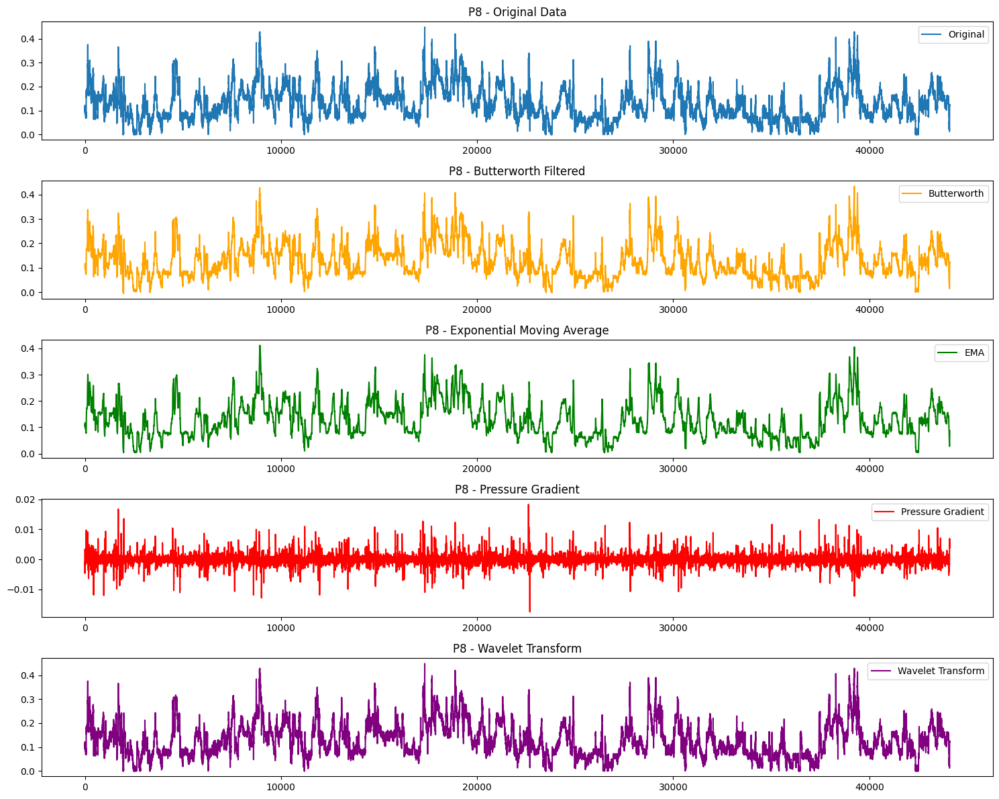

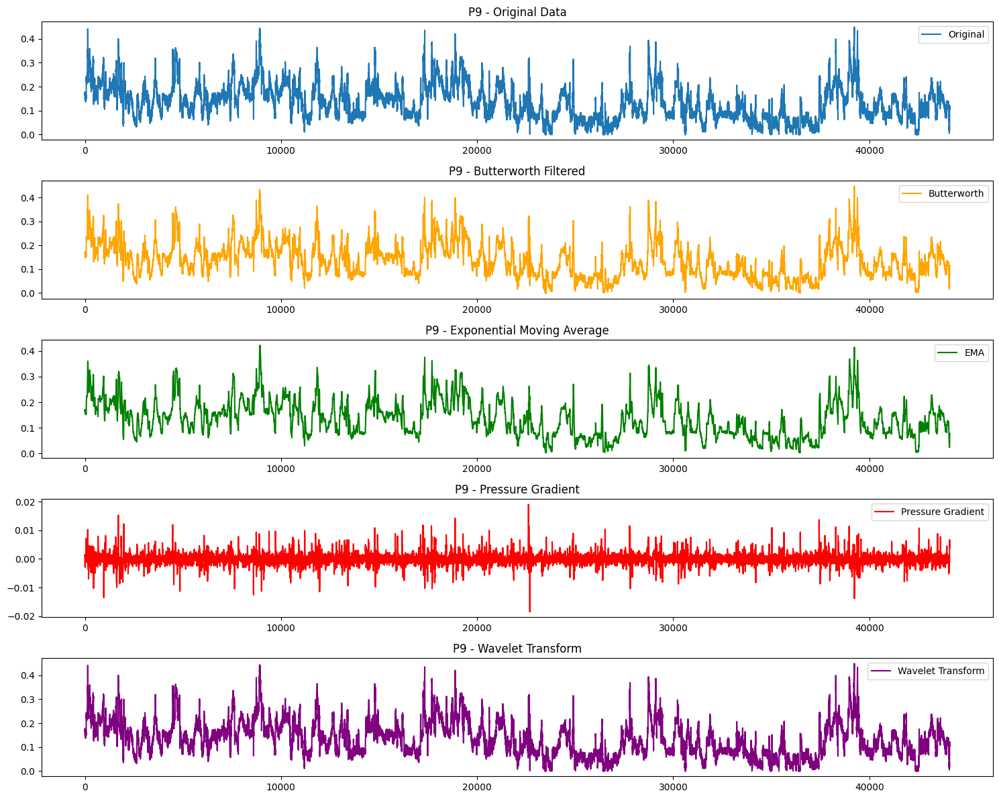

In [14]:
# P8, P9에 대해 시각화
for col in ['P8', 'P9']:
    plot_preprocessing_comparison(
        df_pressure, 
        df_butter, 
        df_ema, 
        df_gradient,
        df_wavelet,
        col
    )

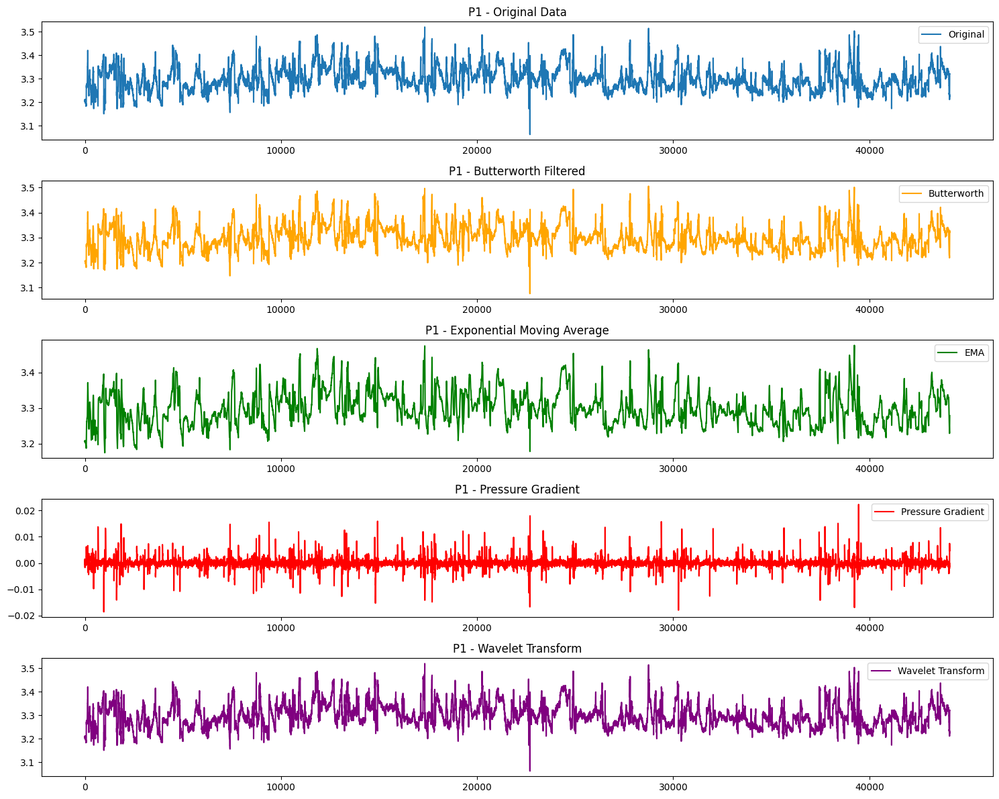

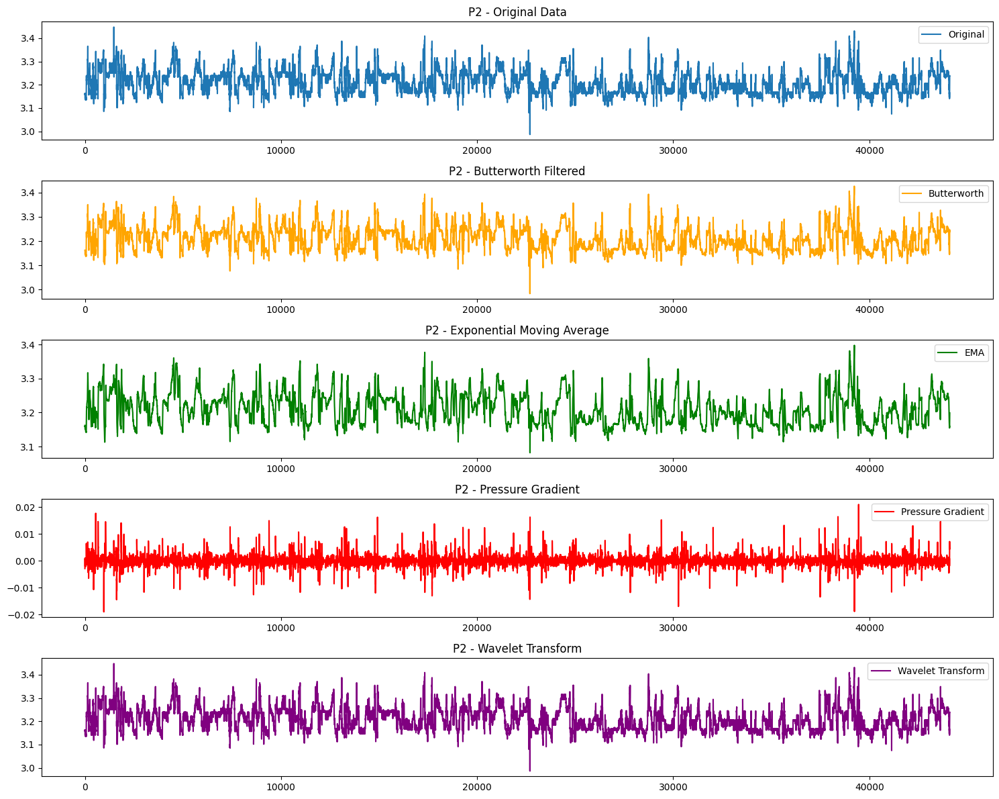

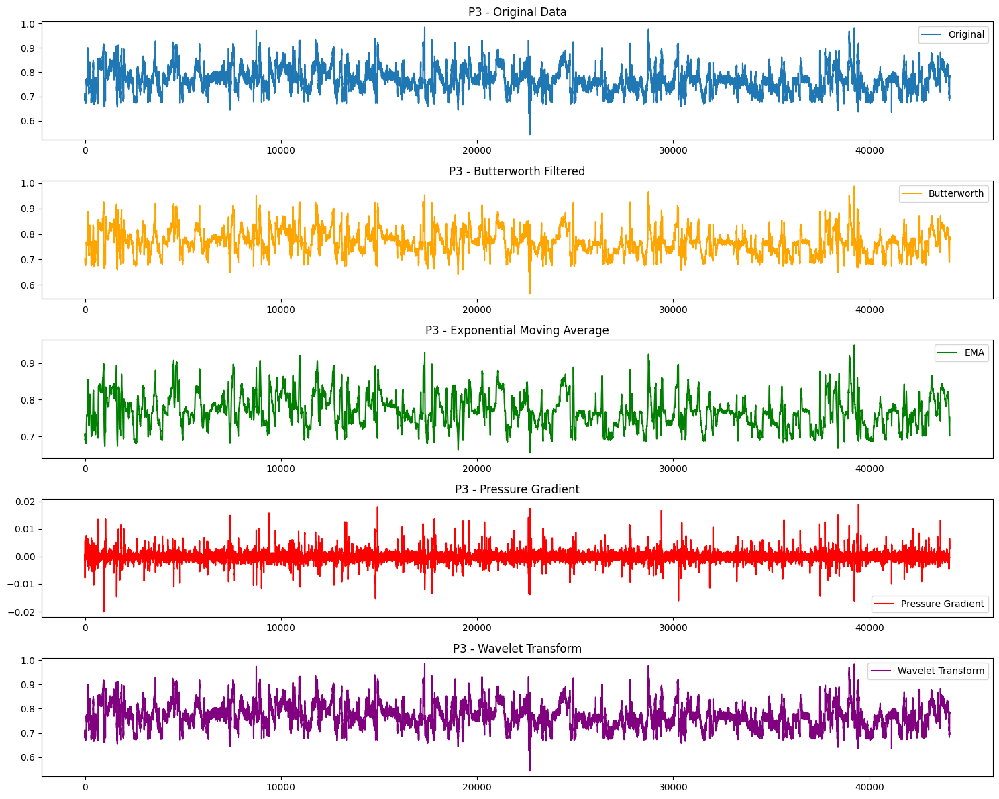

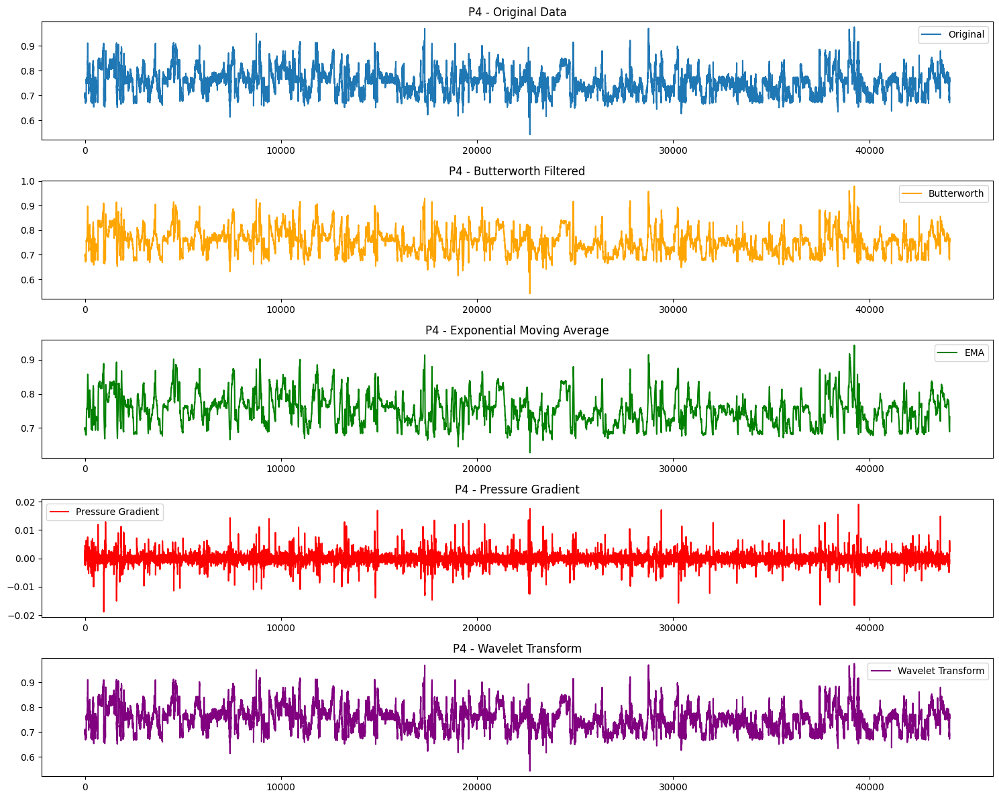

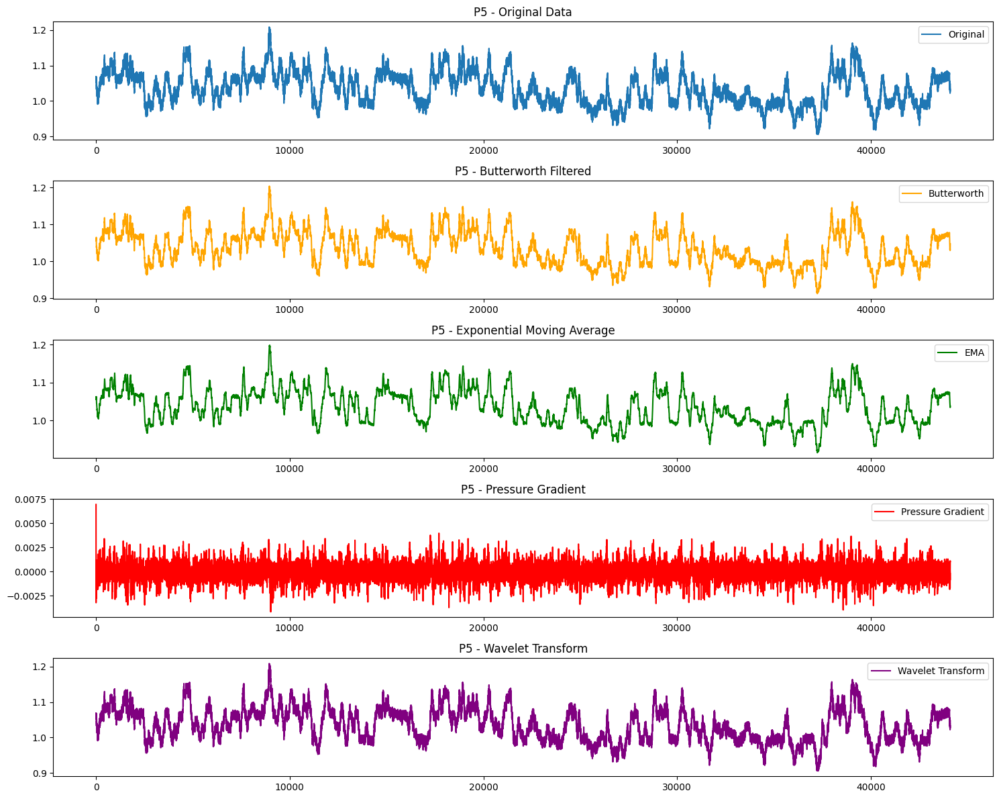

...

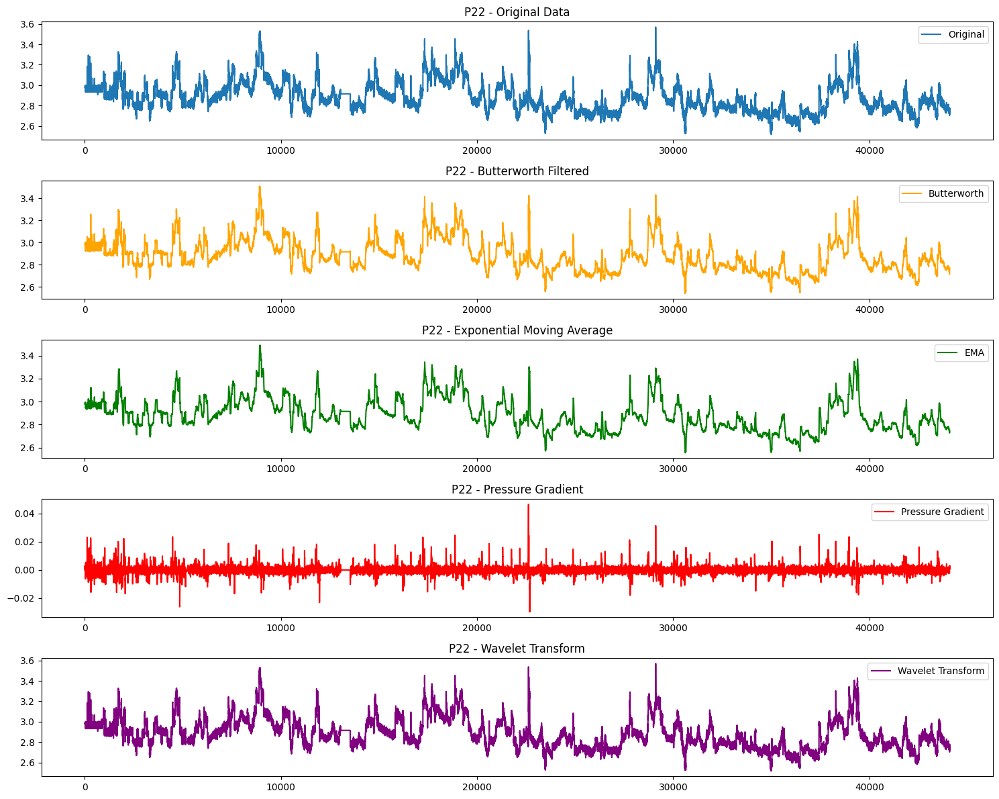

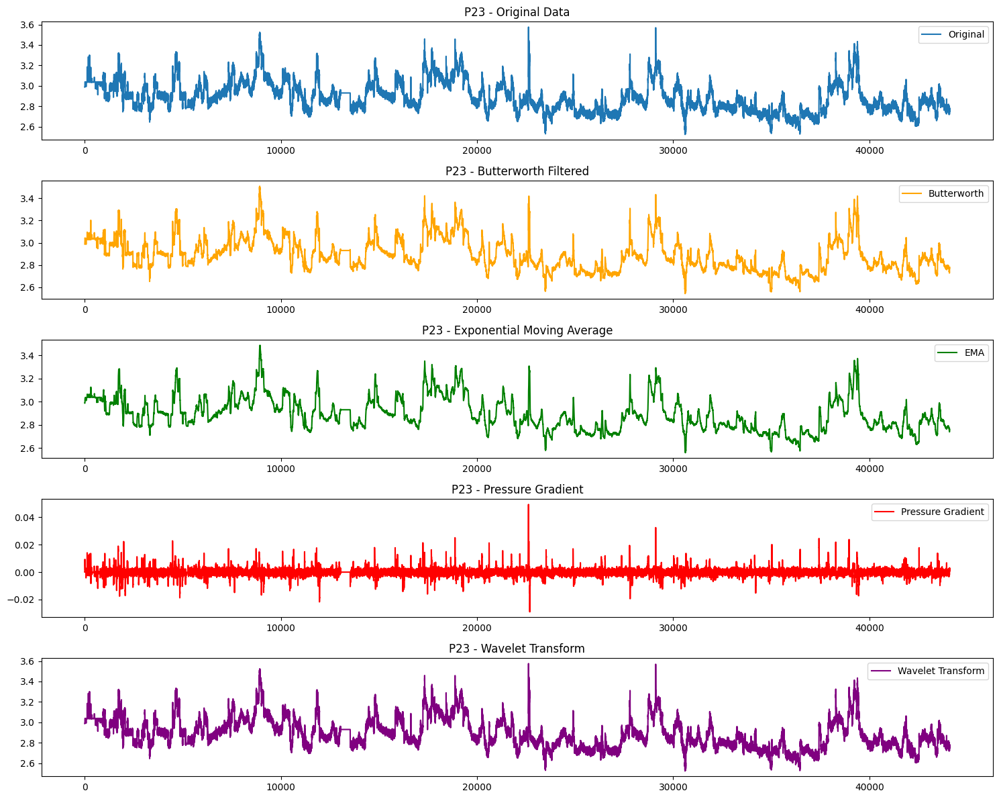

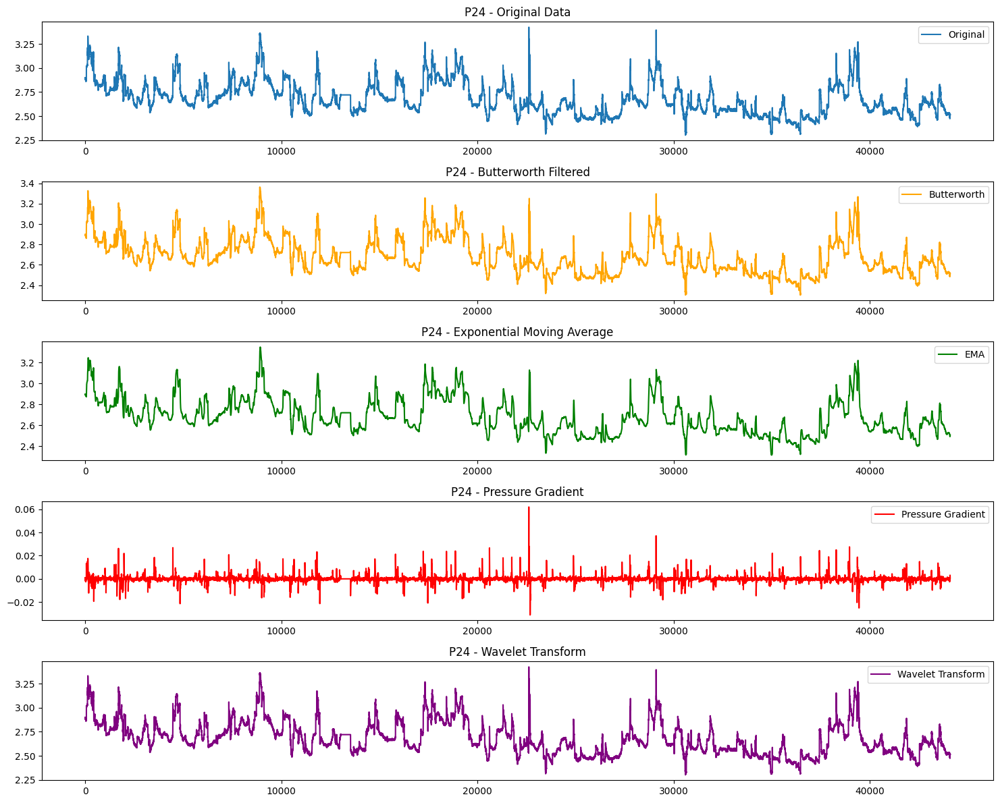

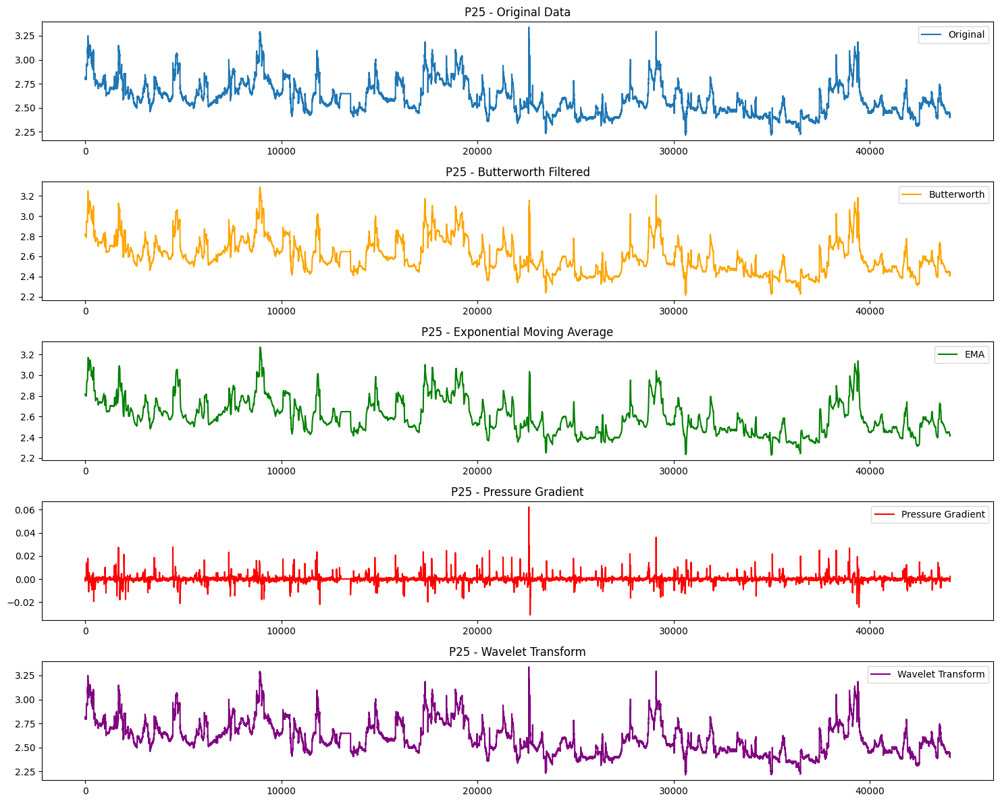

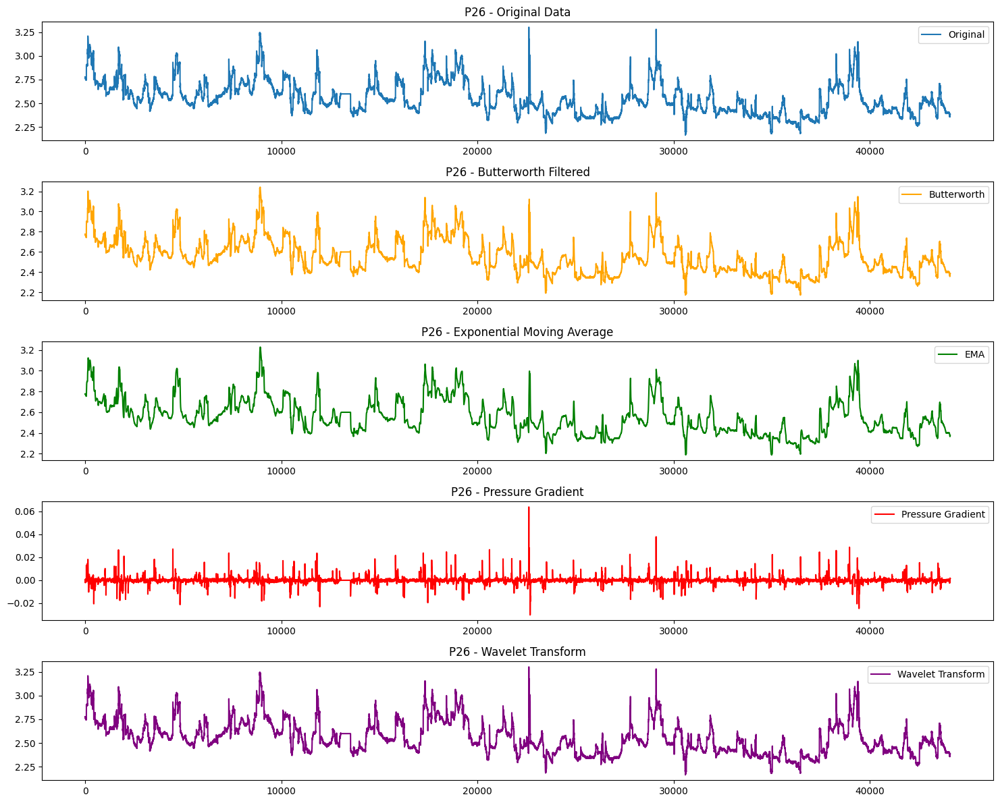

In [15]:
# P8, P9에 대해 시각화
for col in pressure_cols:
    plot_preprocessing_comparison(
        df_pressure, 
        df_butter, 
        df_ema, 
        df_gradient,
        df_wavelet,
        col
    )

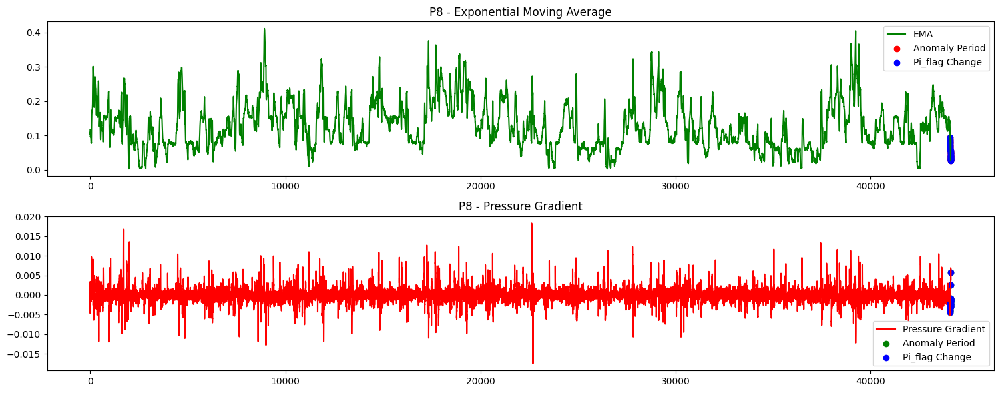

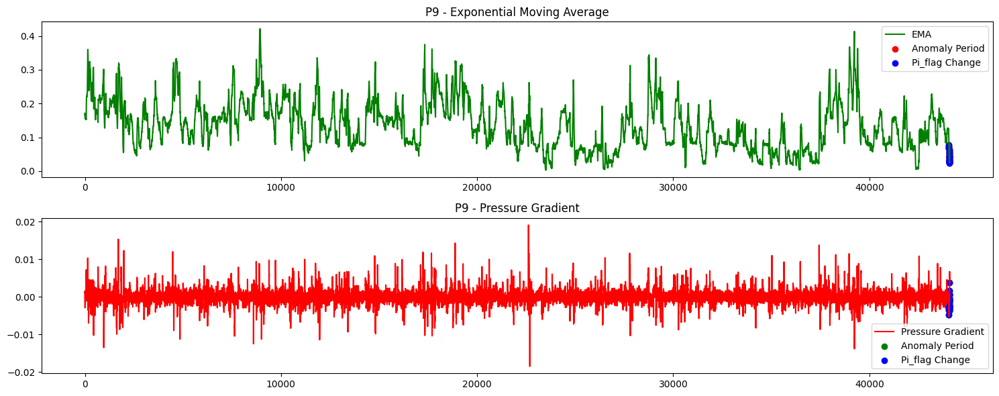

In [14]:
# 시각화 함수
def plot_pressure_analysis(col):
    # 1. EMA 시각화
    plt.figure(figsize=(15, 6))
    plt.subplot(2, 1, 1)
    plt.plot(df_ema[col], label='EMA', color='green')
    
    # anomaly 기간 표시
    anomaly_period = df_A[df_A['anomaly'] == 1].index
    plt.scatter(anomaly_period, df_ema.loc[anomaly_period, col], 
               color='red', label='Anomaly Period')
    
    # Pi_flag 변화 표시
    flag_changes = df_A[df_A[f'{col}_flag'] == 1].index
    plt.scatter(flag_changes, df_ema.loc[flag_changes, col], 
               color='blue', label='Pi_flag Change')
    
    plt.title(f'{col} - Exponential Moving Average')
    plt.legend()
    
    # 2. Pressure Gradient 시각화
    plt.subplot(2, 1, 2)
    plt.plot(df_gradient[col], label='Pressure Gradient', color='red')
    
    # anomaly 기간 표시
    plt.scatter(anomaly_period, df_gradient.loc[anomaly_period, col], 
               color='green', label='Anomaly Period')
    
    # Pi_flag 변화 표시
    plt.scatter(flag_changes, df_gradient.loc[flag_changes, col], 
               color='blue', label='Pi_flag Change')
    
    plt.title(f'{col} - Pressure Gradient')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# P8, P9에 대해 시각화
for col in ['P8','P9']:
    plot_pressure_analysis(col)

In [15]:
def multi_stage_preprocessing(df, pressure_cols, ema_span=10, butter_cutoff=0.1):
    preprocessed_data = {}
    
    # 1. 노이즈 제거 단계
    def apply_butterworth(data, cutoff=butter_cutoff, fs=1.0, order=5):
        nyq = 0.5 * fs
        normal_cutoff = cutoff / nyq
        b, a = butter(order, normal_cutoff, btype='low', analog=False)
        return filtfilt(b, a, data)
    
    for col in pressure_cols:
        # EMA 적용
        ema = df[col].ewm(span=ema_span, adjust=False).mean()
        
        # Butterworth 필터 적용
        butter_filtered = apply_butterworth(ema.values)
        
        # 2. 특성 추출 단계
        # Pressure Gradient
        gradient = np.gradient(butter_filtered)
        
        # Rolling Statistics
        rolling_mean = pd.Series(butter_filtered).rolling(window=5).mean()
        rolling_std = pd.Series(butter_filtered).rolling(window=5).std()
        
        # Lag Features (t-1, t-2 시점의 값)
        lag1 = pd.Series(butter_filtered).shift(1)
        lag2 = pd.Series(butter_filtered).shift(2)
        
        # 결과 저장
        preprocessed_data[f'{col}_ema'] = ema
        preprocessed_data[f'{col}_butter'] = butter_filtered
        preprocessed_data[f'{col}_gradient'] = gradient
        preprocessed_data[f'{col}_rolling_mean'] = rolling_mean
        preprocessed_data[f'{col}_rolling_std'] = rolling_std
        preprocessed_data[f'{col}_lag1'] = lag1
        preprocessed_data[f'{col}_lag2'] = lag2
    
    # DataFrame으로 변환
    result_df = pd.DataFrame(preprocessed_data, index=df.index)
    
    # NaN 값 처리
    result_df = result_df.fillna(method='bfill')
    
    return result_df


In [16]:
# 전처리 적용
pressure_cols = [f'P{i}' for i in range(1, 27)]
preprocessed_df = multi_stage_preprocessing(df_A, pressure_cols)

C:\Users\leonk\AppData\Local\Temp\ipykernel_29760\1479813460.py:43: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  result_df = result_df.fillna(method='bfill')


In [17]:
def plot_preprocessing_results(df_A, preprocessed_df, col):
    plt.figure(figsize=(15, 10))
    
    # 원본 데이터
    plt.subplot(4, 1, 1)
    plt.plot(df_A[col], label='Original')
    # Pi_flag 변화 지점 표시
    flag_changes = df_A[df_A[f'{col}_flag'] == 1].index
    plt.scatter(flag_changes, df_A.loc[flag_changes, col], 
               color='red', marker='*', s=100, label='Pi_flag Change')
    plt.title(f'{col} - Original Data')
    plt.legend()
    
    # EMA + Butterworth
    plt.subplot(4, 1, 2)
    plt.plot(preprocessed_df[f'{col}_ema'], label='EMA', alpha=0.7)
    plt.plot(preprocessed_df[f'{col}_butter'], label='Butterworth', alpha=0.7)
    plt.scatter(flag_changes, preprocessed_df.loc[flag_changes, f'{col}_ema'], 
               color='red', marker='*', s=100, label='Pi_flag Change')
    plt.title('Noise Reduction Stage')
    plt.legend()
    
    # Pressure Gradient
    plt.subplot(4, 1, 3)
    plt.plot(preprocessed_df[f'{col}_gradient'], label='Gradient', color='red')
    plt.scatter(flag_changes, preprocessed_df.loc[flag_changes, f'{col}_gradient'], 
               color='blue', marker='*', s=100, label='Pi_flag Change')
    plt.title('Pressure Gradient')
    plt.legend()
    
    # Rolling Statistics
    plt.subplot(4, 1, 4)
    plt.plot(preprocessed_df[f'{col}_rolling_mean'], label='Rolling Mean')
    plt.plot(preprocessed_df[f'{col}_rolling_std'], label='Rolling STD')
    plt.scatter(flag_changes, preprocessed_df.loc[flag_changes, f'{col}_rolling_mean'], 
               color='red', marker='*', s=100, label='Pi_flag Change')
    plt.title('Rolling Statistics')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


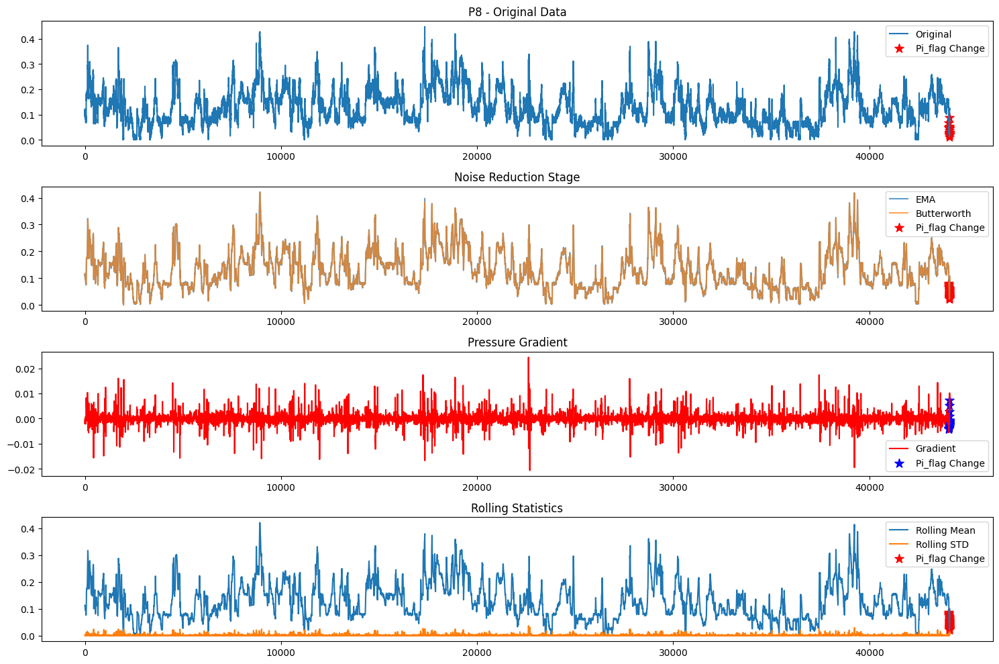

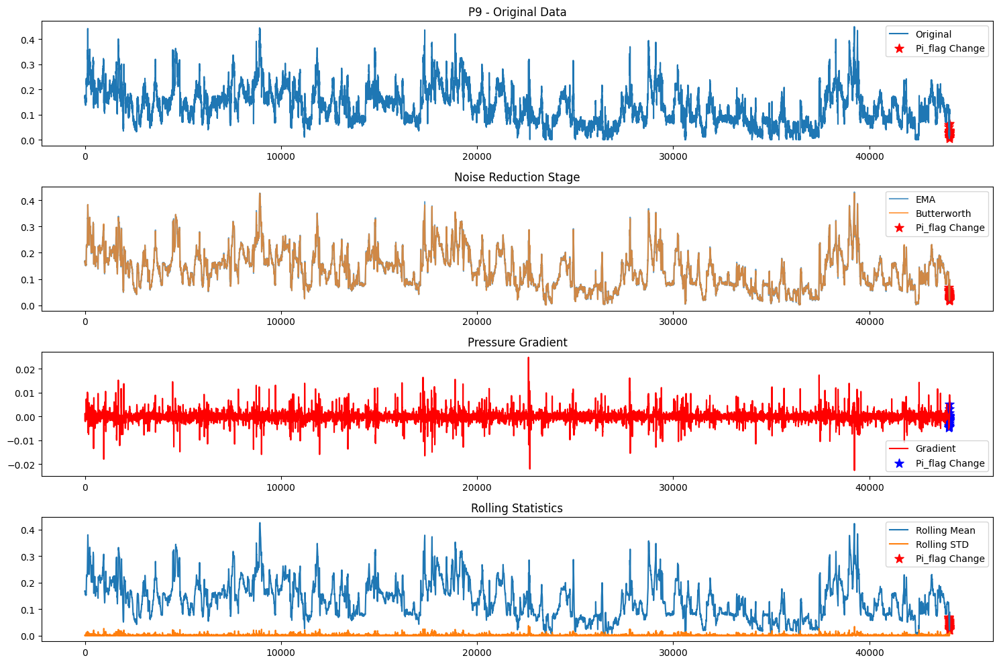

In [18]:
# P8, P9에 대해 결과 시각화
for col in ['P8', 'P9']:
    plot_preprocessing_results(df_A, preprocessed_df, col)

`-` 해결해야할 문제 : P 압력계에서 일어나는 이상치를 탐지

- Q1 ~ Q5 : 유량 정량 정보
- M1 ~ M14 : 이진 분류되어진 펌프가동정보, 이산형 데이터 0이면 꺼진거 1이면 켜진거
- P1 ~ P26 : 해당 펌프의 상수도의 압력계 정량 정보 0이면 정상 1이면 이상치!!
- P1_flag ~ P26_flag : 어떠한 P에 이상 탐지 여부, 이진 분류, test set에선 제공되지 않는다
- anomaly : 이상 탐지 여부, train set에서만 존재, P1_flag ~ P26_flag에서 감지되면 해당 변수에서도 체크된다, test set에선 제공되지 않는다
- Data set : $ D_{train} \in R^{n \times m} $ , $n = 1,2,...,44101,\quad m = 1,2,...,73$
- $n$단위는 1분, 결측치 존재 X


---
# EDA 
- 이상탐지여부 중심으로 진행
- 매우 낮은 이상치 갯수 

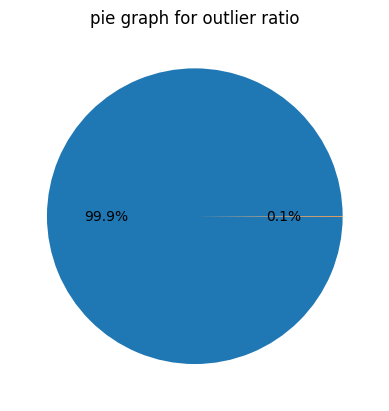

In [19]:
plt.pie(df_A[["anomaly"]].value_counts(),autopct='%1.1f%%')
plt.title("pie graph for outlier ratio")
plt.show()

In [20]:
df_true = df_A[df_A["anomaly"] == 1].iloc[:,1:(5+14+26+1)]
df_false = df_A[df_A["anomaly"] != 1].iloc[:,1:(5+14+26+1)]

## Q1~Q5 박스플랏
- 시계열 데이터를 박스플랏으로 보기는 조금 난해하지만 이상치가 표본으로부터 얼마나 거리가 떨어져있는지 확인하기 위해 박스플랏을 그려보았다
- Q3는 다른 데이터에 비해 분포가 매우 큰 차이가 날 것으로 보인다.

C:\Users\leonk\AppData\Local\Temp\ipykernel_29760\3374142136.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[row, col].boxplot(
C:\Users\leonk\AppData\Local\Temp\ipykernel_29760\3374142136.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[row, col].boxplot(
C:\Users\leonk\AppData\Local\Temp\ipykernel_29760\3374142136.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[row, col].boxplot(
C:\Users\leonk\AppData\Local\Temp\ipykernel_29760\3374142136.py:11: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will 

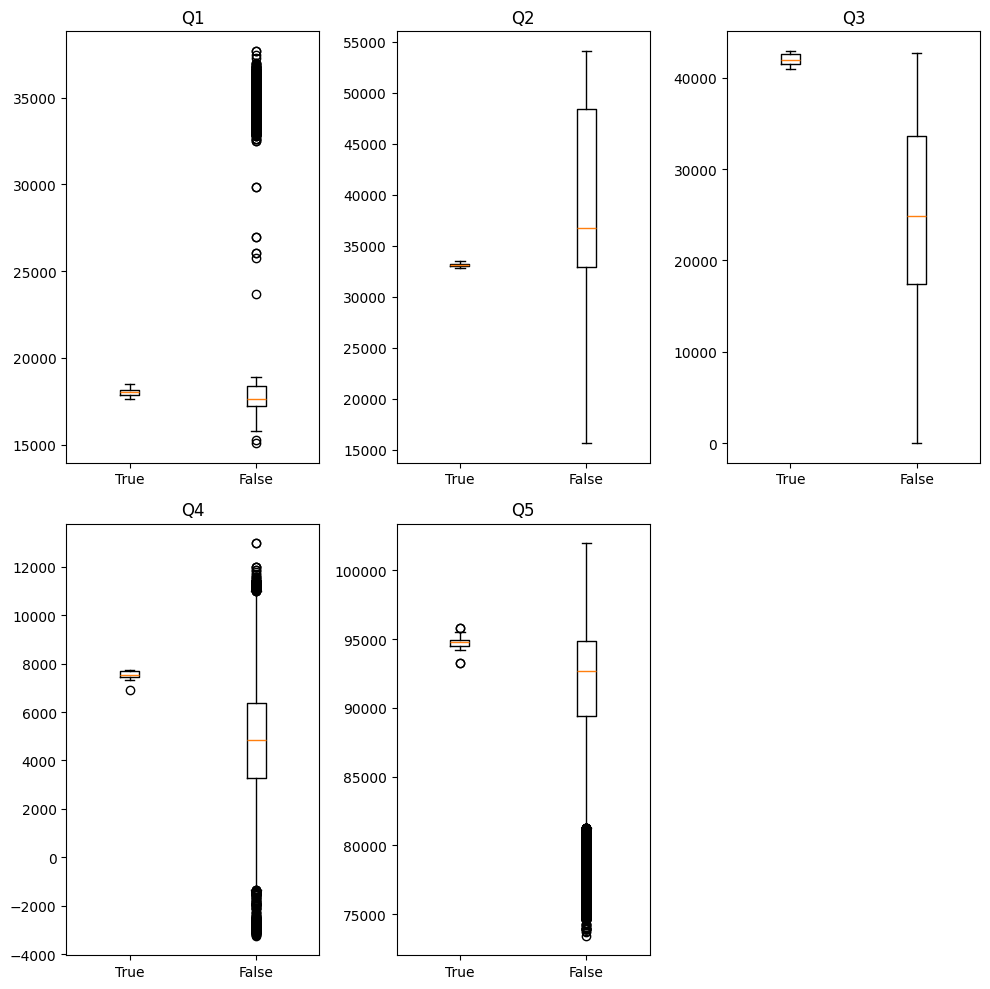

In [21]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 3, figsize=(10, 10))

titles = ["Q1", "Q2", "Q3", "Q4", "Q5"]
data = [df_true.iloc[:, i].values for i in range(5)]
labels = ["True", "False"]

for i in range(5):
    row, col = divmod(i, 3)  # 2x3 배열에서 행(row)과 열(col) 계산
    ax[row, col].boxplot(
        [data[i], df_false.iloc[:, i].values], 
        labels=labels
    )
    ax[row, col].set_title(titles[i])

# 필요 없는 격자 숨기기 (마지막 서브플롯)
ax[1, 2].axis("off")


plt.tight_layout()  # 레이아웃 조정
plt.show()

## Q1~Q5 시도표
- 그래프를 통해, 시계열 추세가 매우 변동이 큰 것을 보아 포인트를 찾는 이상치 기법보단 구간별로 이상치를 찾아야할 것으로 보인다.

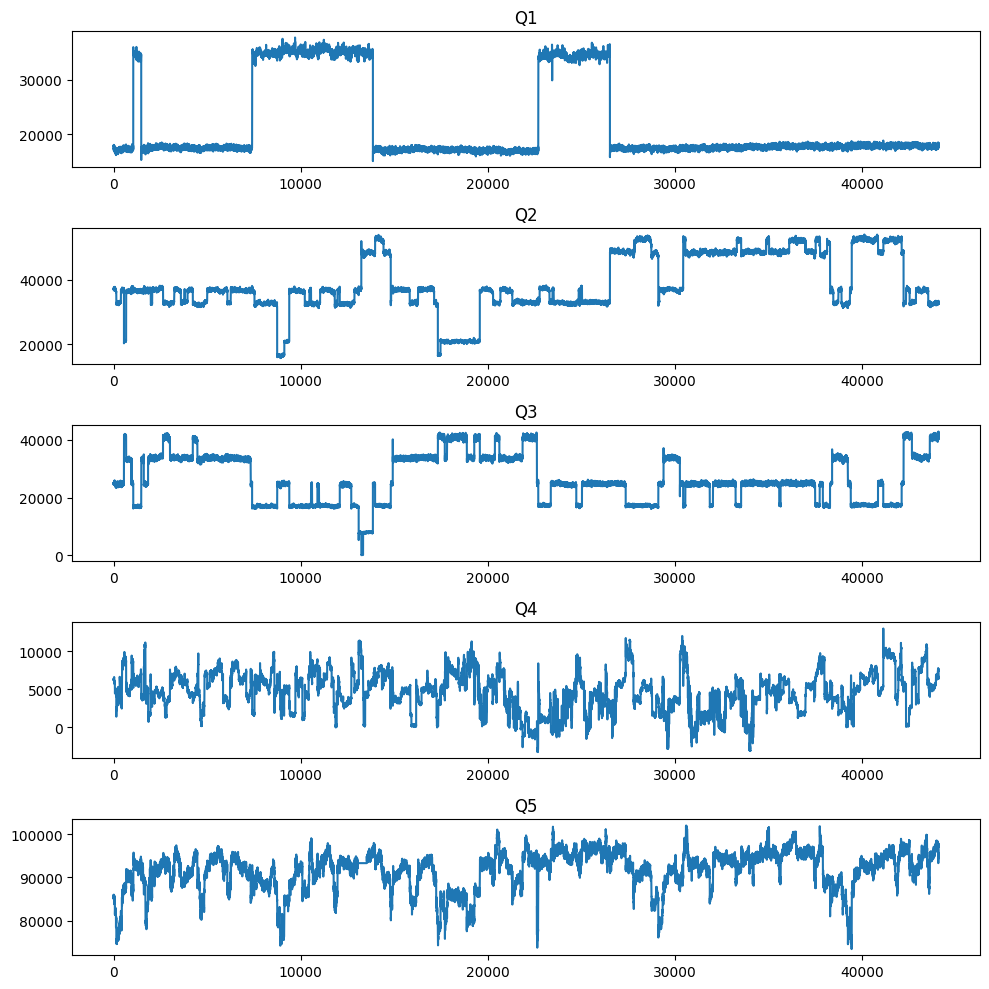

In [22]:
fig, ax = plt.subplots(5,1,figsize=(10,10))
for i in range(0,5):
    ax[i].plot(df_A[f'Q{i+1}'])
    ax[i].set_title(titles[i])

plt.tight_layout()
plt.show()

## 이상치 구간 시각화

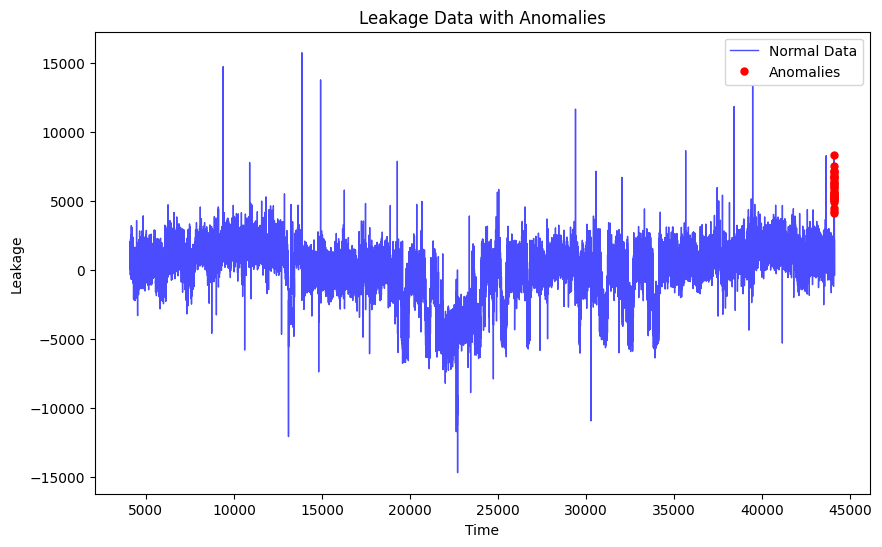

In [23]:
# 그래프 생성
fig, ax = plt.subplots(figsize=(10, 6))

# 정상 데이터 플롯
ax.plot(
    df_A.index[-40000:],  # 시간 축
    df_A['leakage'][-40000:],  # leakage 데이터
    label="Normal Data",
    color="blue",
    linewidth=1,
    alpha=0.7
)

# 이상치 데이터 플롯
ax.plot(
    df_A.index[df_A["anomaly"] == 1],  # 이상치의 시간
    df_A['leakage'][df_A["anomaly"] == 1],  # 이상치의 leakage 값
    label="Anomalies",
    color="red",
    marker='o',
    linestyle='None',
    markersize=5
)

# 그래프 설정
ax.set_title('Leakage Data with Anomalies')
ax.set_xlabel('Time')
ax.set_ylabel('Leakage')
ax.legend()

plt.show()

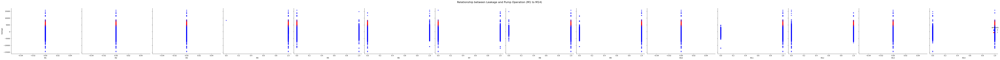

In [24]:
# Select pump operation data (M1 to M14) and leakage
data_pump = df_A[['leakage', 'anomaly'] + [f'M{i}' for i in range(1, 15)]]

# Create a custom palette
palette = {0: 'blue', 1: 'red'}

# Create a pairplot to visualize relationships between leakage and pump operation
g = sns.pairplot(data_pump, y_vars=['leakage'], x_vars=[f'M{i}' for i in range(1, 15)],
                 kind='scatter', height=5, aspect=1.2,
                 plot_kws={'alpha': 0.6, 'edgecolor': 'none'},
                 hue='anomaly', palette=palette)

# Adjust the layout and title
g.fig.suptitle('Relationship between Leakage and Pump Operation (M1 to M14)', y=1.02, fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

1. M1-0 
2. M2-0
3. M3-0
4. M4-대부분1 anomaly
5. M5-0,1반반 0일때 anomaly
6. M6-0,1 반반 0일 때 anomaly
7. M7- 0,1 반반 0일 때 anomaly
8. M8- 0,1 중 1이 조금더 많음, 1일때 anomaly
9. M9-0,1 중 1이 조금 더 많음, 1일 때 anomaly
10. M10- 0
11. M11-0,1 중 1이 조금 더 많음, 1일 때 anomaly
12. M12-0,1 중 0이 조금 더 많음, 1일 때 anomaly
13. M13-0
14. M14 반반 1일때 anomaly 

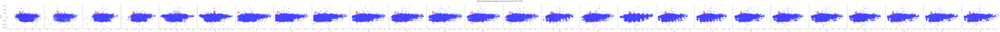

In [25]:
# Select pressure sensor data (P1 to P26), leakage, and anomaly
data_pressure = df_A[['leakage', 'anomaly'] + [f'P{i}' for i in range(1, 27)]]

# Create a pairplot for pressure sensors vs leakage with anomaly highlighting
palette = {0: 'blue', 1: 'red'}  # Normal data in blue, anomalies in red
g = sns.pairplot(
    data_pressure,
    y_vars=['leakage'],
    x_vars=[f'P{i}' for i in range(1, 27)],
    hue='anomaly',
    palette=palette,
    kind='scatter',
    height=5,
    aspect=1.2,
    plot_kws={'alpha': 0.6}
)

# Adjust the layout and title
g.fig.suptitle('Relationship between Leakage and Pressure Sensors (P1 to P26)', y=1.02, fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()
#p_flag에 대한 인사이트 보인다. p7,8,9에서 확실히

C:\Users\leonk\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


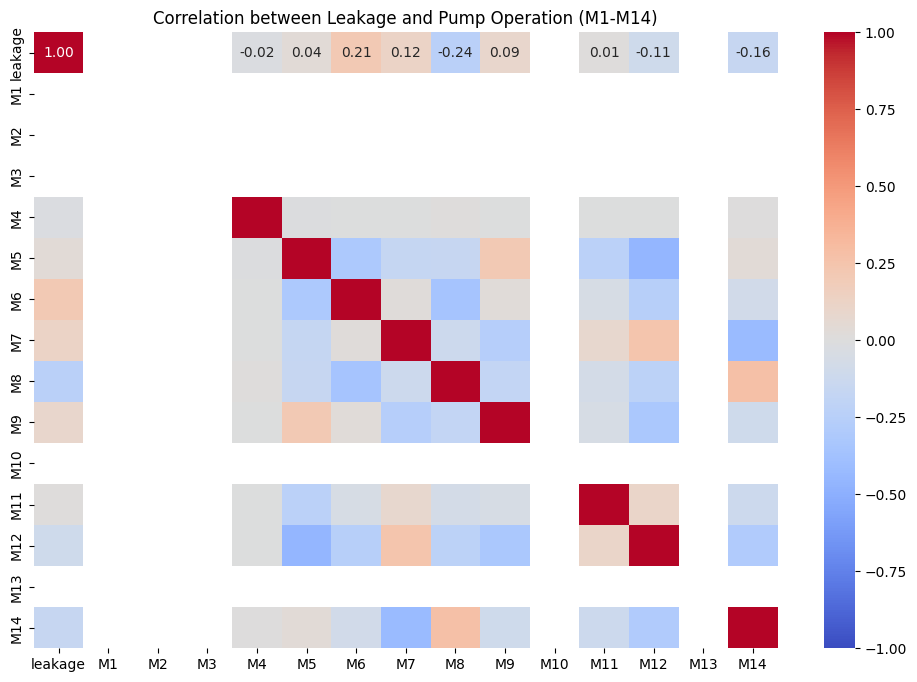

In [26]:
# 펌프 가동 여부(M1~M14)와 누수 데이터 상관관계 히트맵
plt.figure(figsize=(12, 8))
pump_corr = df_A[['leakage'] + [f'M{i}' for i in range(1, 15)]].corr()
sns.heatmap(pump_corr, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation between Leakage and Pump Operation (M1-M14)')
plt.show()

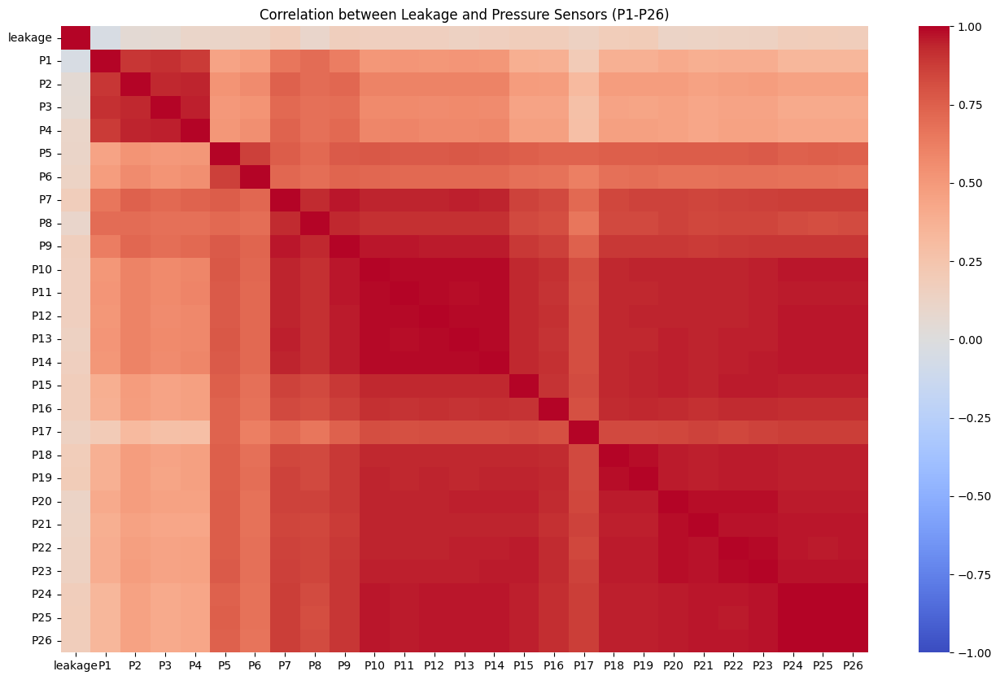

In [27]:
# 압력 센서 데이터(P1~P26)와 누수 데이터 상관관계 히트맵
plt.figure(figsize=(16, 10))
pressure_corr = df_A[['leakage'] + [f'P{i}' for i in range(1, 27)]].corr()
sns.heatmap(pressure_corr, annot=False, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation between Leakage and Pressure Sensors (P1-P26)')
plt.show()

## M1~M14
- 아래 표는 이상치 여부가 1인 데이터의 M1~M14를 합산하여 평균낸 것으로 이상치가 탐지된 구간에서 비율이 1인 것을 알 수 있다.
  - 이는 TRAIN_A 데이터에서 이상치는 M4, M8, M9, M11, M12, M14이 무조건 1로 체크되어있다는 의미이다.
- 하지만 이상치여부가 0인 데이터는 이상치와는 다르게 집계된 것을 확인할 수 있다.

In [28]:
pd.DataFrame({'anomaly':np.sum(df_true.iloc[:,5:(5+14)],axis=0) / 30,
              'No anomaly':np.sum(df_false.iloc[:,5:(5+14)],axis=0) / len(df_false)})#,np.sum(df_false.iloc[:,5:(5+14)],axis=0)

,anomaly,No anomaly
M1,0.0,0.000000
M2,0.0,0.000000
M3,0.0,0.000000
M4,1.0,0.999977
M5,0.0,0.243153
M6,0.0,0.619863
M7,0.0,0.496245
M8,1.0,0.769758
M9,1.0,0.877584
M10,0.0,0.000000


## P1 ~ P26 시도표
- 관망구조를 보면 P1부터 P26은 하나의 구조로 이루어져 있는 것을 확인하였다.
- 이는 서로 집계되는 압력이 어느정도 상관관계가 있을 것으로 보이며, 다변량 문제로 접근해봐야 한다는 의미로도 볼 수 있다.
- 시도표에서도 추세, 계절 성분으로 보이는 것들이 근접한 P 사이에서 대체적으로 비슷하게 나타나 있는 것을 확인할 수 있었다. 

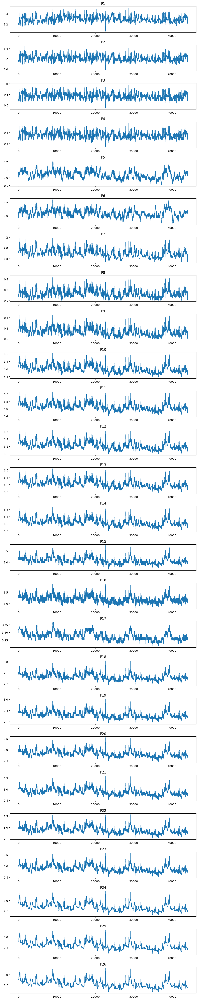

In [29]:
P = df_true.columns[[df_true.columns[i][0] == 'P' for i in range(len(df_true.columns))]]

fig, ax = plt.subplots(len(P),1,figsize=(10,50))
df_Ap= df_A[P]
for i in range(len(P)):
    ax[i].plot(df_Ap[f'P{i+1}'])
    ax[i].set_title(P[i])

plt.tight_layout()
plt.show()
#밸브 개도율 압력계: p7,p10,p11,p13,p14,p15,p16,p18,p19,p20,p21,p22,p23
#p17은 독립적

## 이상치 시각화

- P 데이터는 이상치 여부를 판단하는 아주 중요한 변수로 보인다.
- TEST SET에서도 P의 개수에 따라 제출해야하는 이상치 개수가 달라진다. 예를 들어 TEST-C0000이 P가 10개면, 10개에 대한 이상치 탐지 여부를 제출해야한다는 의미이다.

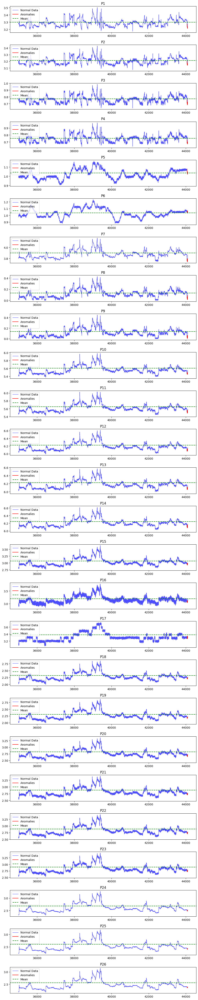

In [30]:
# P로 시작하는 컬럼 선택
P = df_true.columns[[df_true.columns[i][0] == 'P' for i in range(len(df_true.columns))]]
df_Ap = df_A[P]  # P로 시작하는 열만 선택

# 플롯 생성
fig, ax = plt.subplots(len(P), 1, figsize=(10, 50))

for i in range(len(P)):
    # 정상 데이터 플롯
    ax[i].plot(
        df_A.index[35000:45000],  # 시간 축
        df_Ap[P[i]][35000:45000],  # P 데이터
        label="Normal Data",
        color="blue",
        linewidth=1,
        alpha=0.7
    )

    # 이상치 데이터 플롯
    ax[i].plot(
        df_A.index[df_A["anomaly"] == 1],  # 이상치 시간
        df_Ap[P[i]][df_A["anomaly"] == 1],  # 이상치 값
        label="Anomalies",
        color="red",
        linewidth=1.5  # 두께 강조
    )

    # 평균선 추가
    mean_value = df_Ap[P[i]].mean()  # 평균값 계산
    ax[i].axhline(mean_value, color="green", linestyle="--", label="Mean")  # 수평선 추가

    # 제목 및 범례 추가
    ax[i].set_title(P[i])
    ax[i].legend()

plt.tight_layout()  # 레이아웃 조정
plt.show()


In [31]:
import pandas as pd

# anomaly == 1인 데이터에서 timestamp 열만 선택
timestamps = df_A[df_A["anomaly"] == 1]["timestamp"]

# DataFrame으로 변환 (엑셀 저장을 위해)
timestamps_df = timestamps.reset_index(drop=True).to_frame(name="timestamp")

# 엑셀 파일로 저장
timestamps_df.to_excel("timestamps.xlsx", index=False)

print("timestamp 데이터가 'timestamps.xlsx' 파일로 저장되었습니다.")

timestamp 데이터가 'timestamps.xlsx' 파일로 저장되었습니다.


In [32]:
timestamps_df

,timestamp
0,24/06/26 14:21
1,24/06/26 14:22
2,24/06/26 14:23
3,24/06/26 14:24
4,24/06/26 14:25
5,24/06/26 14:26
6,24/06/26 14:27
7,24/06/26 14:28
8,24/06/26 14:29
9,24/06/26 14:30


In [33]:
df_A[df_A["anomaly"] == 1]

,timestamp,Q1,Q2,Q3,Q4,Q5,M1,M2,M3,M4,...,P18_flag,P19_flag,P20_flag,P21_flag,P22_flag,P23_flag,P24_flag,P25_flag,P26_flag,leakage
44061,24/06/26 14:21,18490,33011.001,41933.003,7424,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6002.004
44062,24/06/26 14:22,18010,33131.001,42305.000,7720,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6310.001
44063,24/06/26 14:23,18010,33131.001,42305.000,7720,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6719.001
44064,24/06/26 14:24,18410,32854.001,41058.003,7752,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5627.004
44065,24/06/26 14:25,17640,33086.001,41443.003,7711,94802,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5078.004
44066,24/06/26 14:26,18100,33428.000,41121.001,7544,94802,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5391.001
44067,24/06/26 14:27,18100,33428.000,41121.001,7544,94577,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5616.001
44068,24/06/26 14:28,18180,33322.000,41728.999,7517,94484,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6263.999
44069,24/06/26 14:29,17610,33248.000,42721.001,7504,94473,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6610.001
44070,24/06/26 14:30,17610,33248.000,42721.001,7504,94672,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6411.001


In [34]:
#시계열 자료로 변환
df_A['timestamp'] = pd.to_datetime(df_A['timestamp'], format='%y/%m/%d %H:%M')

In [35]:
df_A['timestamp'].head()

0   2024-05-27 00:00:00
1   2024-05-27 00:01:00
2   2024-05-27 00:02:00
3   2024-05-27 00:03:00
4   2024-05-27 00:04:00
Name: timestamp, dtype: datetime64[ns]

In [36]:
# anomaly가 1인 시간대 찾기
anomaly_times = df_A[df_A['anomaly'] == 1]['timestamp']

In [37]:
print(df_A['timestamp'].min(), df_A['timestamp'].max())

2024-05-27 00:00:00 2024-06-26 15:00:00


In [38]:
# anomaly가 1인 연속된 구간 찾기
anomaly_start = df_A[df_A['anomaly'] == 1]['timestamp'].min()
anomaly_end = df_A[df_A['anomaly'] == 1]['timestamp'].max()

In [39]:
anomaly_start

Timestamp('2024-06-26 14:21:00')

In [40]:
anomaly_end

Timestamp('2024-06-26 14:50:00')

In [41]:
# 데이터 추출
filtered_data = df_A[df_A["anomaly"] == 1]

In [42]:
filtered_data

,timestamp,Q1,Q2,Q3,Q4,Q5,M1,M2,M3,M4,...,P18_flag,P19_flag,P20_flag,P21_flag,P22_flag,P23_flag,P24_flag,P25_flag,P26_flag,leakage
44061,2024-06-26 14:21:00,18490,33011.001,41933.003,7424,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6002.004
44062,2024-06-26 14:22:00,18010,33131.001,42305.000,7720,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6310.001
44063,2024-06-26 14:23:00,18010,33131.001,42305.000,7720,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6719.001
44064,2024-06-26 14:24:00,18410,32854.001,41058.003,7752,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5627.004
44065,2024-06-26 14:25:00,17640,33086.001,41443.003,7711,94802,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5078.004
44066,2024-06-26 14:26:00,18100,33428.000,41121.001,7544,94802,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5391.001
44067,2024-06-26 14:27:00,18100,33428.000,41121.001,7544,94577,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5616.001
44068,2024-06-26 14:28:00,18180,33322.000,41728.999,7517,94484,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6263.999
44069,2024-06-26 14:29:00,17610,33248.000,42721.001,7504,94473,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6610.001
44070,2024-06-26 14:30:00,17610,33248.000,42721.001,7504,94672,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6411.001


In [43]:
filtered_data.head()

,timestamp,Q1,Q2,Q3,Q4,Q5,M1,M2,M3,M4,...,P18_flag,P19_flag,P20_flag,P21_flag,P22_flag,P23_flag,P24_flag,P25_flag,P26_flag,leakage
44061,2024-06-26 14:21:00,18490,33011.001,41933.003,7424,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6002.004
44062,2024-06-26 14:22:00,18010,33131.001,42305.000,7720,94856,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6310.001
44063,2024-06-26 14:23:00,18010,33131.001,42305.000,7720,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,6719.001
44064,2024-06-26 14:24:00,18410,32854.001,41058.003,7752,94447,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5627.004
44065,2024-06-26 14:25:00,17640,33086.001,41443.003,7711,94802,0,0,0,1,...,0,0,0,0,0,0,0,0,0,5078.004


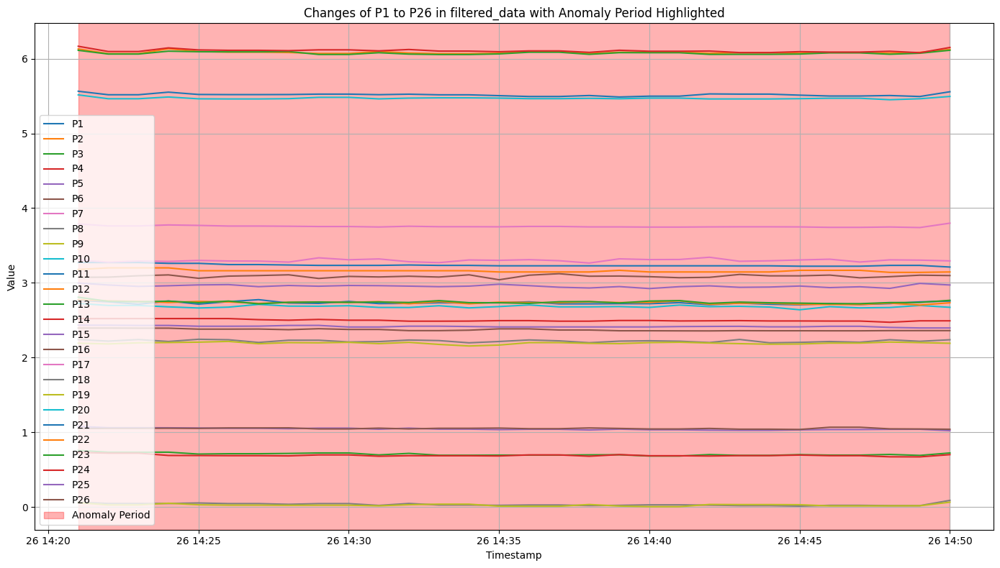

In [44]:
# p1부터 p10까지의 데이터 시각화
plt.figure(figsize=(14, 8))
for i in range(1, 27):
    plt.plot(filtered_data['timestamp'], filtered_data[f'P{i}'], label=f'P{i}')

# anomaly 구간 강조
plt.axvspan(anomaly_start, anomaly_end, color='red', alpha=0.3, label='Anomaly Period')

plt.title('Changes of P1 to P26 in filtered_data with Anomaly Period Highlighted')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


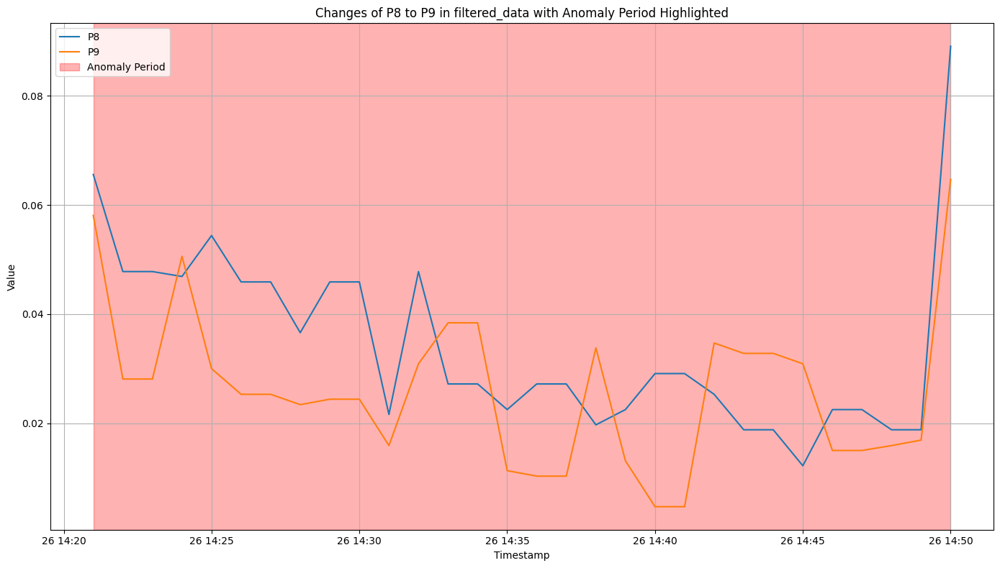

In [45]:
# p1부터 p10까지의 데이터 시각화
plt.figure(figsize=(14, 8))
for i in range(8, 10):
    plt.plot(filtered_data['timestamp'], filtered_data[f'P{i}'], label=f'P{i}')

# anomaly 구간 강조
plt.axvspan(anomaly_start, anomaly_end, color='red', alpha=0.3, label='Anomaly Period')

plt.title('Changes of P8 to P9 in filtered_data with Anomaly Period Highlighted')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [46]:
# 숫자형 컬럼만 선택 (timestamp와 같은 비숫자형 컬럼 제외)
numeric_columns = filtered_data.select_dtypes(include=[np.number]).columns

In [47]:
# P8, P9를 포함한 모든 숫자형 컬럼 간의 상관관계 계산
correlation_matrix = filtered_data[numeric_columns].corr()

In [48]:
# P8, P9와 다른 컬럼들 간의 상관관계만 선택
p8_p9_correlations = correlation_matrix.loc[['P8', 'P9'], :]

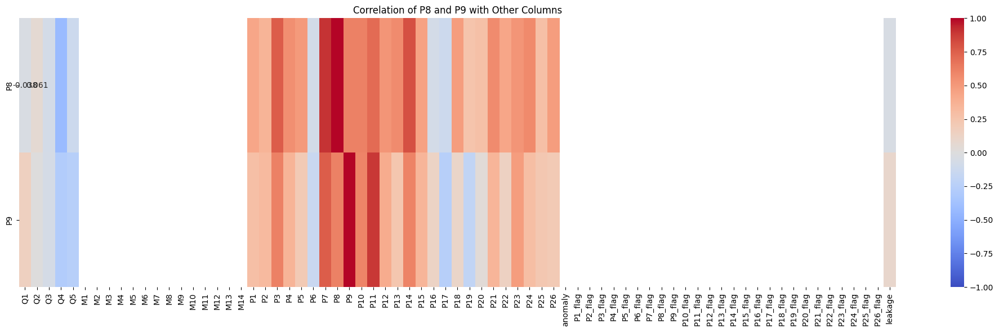

In [49]:
# 히트맵 생성
plt.figure(figsize=(20, 6))
sns.heatmap(p8_p9_correlations, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation of P8 and P9 with Other Columns')
plt.tight_layout()
plt.show()

In [50]:
# P8, P9와 가장 상관관계가 높은 상위 5개 컬럼 출력
print("P8과 가장 상관관계가 높은 상위 10개 컬럼:")
print(correlation_matrix['P8'].sort_values(ascending=False)[1:11])  # P8 자신 제외

P8과 가장 상관관계가 높은 상위 10개 컬럼:
P7     0.902108
P14    0.807657
P3     0.758265
P11    0.710226
P10    0.612410
P9     0.610755
P24    0.573942
P13    0.564762
P21    0.564356
P4     0.553209
Name: P8, dtype: float64


In [51]:
# P8, P9와 가장 상관관계가 높은 상위 5개 컬럼 출력
print("P9와 가장 상관관계가 높은 상위 10개 컬럼:")
print(correlation_matrix['P9'].sort_values(ascending=False)[1:11])

P9와 가장 상관관계가 높은 상위 10개 컬럼:
P11    0.886487
P7     0.764961
P8     0.610755
P3     0.610242
P14    0.605744
P10    0.597846
P23    0.480104
P12    0.401636
P4     0.359354
P21    0.346872
Name: P9, dtype: float64


C:\Users\leonk\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


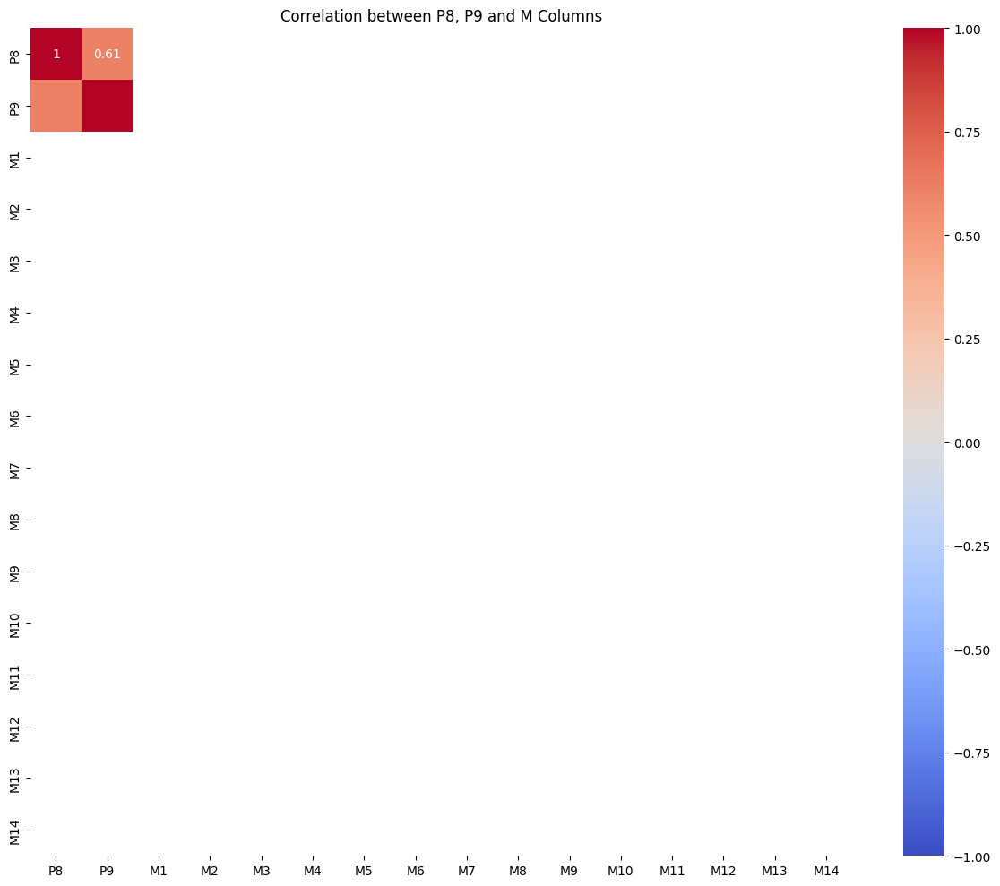

In [52]:
# M으로 시작하는 컬럼 선택
m_columns = [col for col in filtered_data.columns if col.startswith('M')]

# P8, P9와 M으로 시작하는 컬럼 간의 상관관계 계산
correlation_matrix_p_m = filtered_data[['P8', 'P9'] + m_columns].corr()

# 히트맵 생성
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_p_m, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation between P8, P9 and M Columns')
plt.tight_layout()
plt.show()


- Anomaly를 관측할 때 펌프와 압력사이의 상관관계가 0일수록 누수가 났을 가능성이 높다(가설)
- TrainB도 이 가설처럼 나오면 모델을 돌릴때 펌프의 역할은 거의 없을 수도 있다

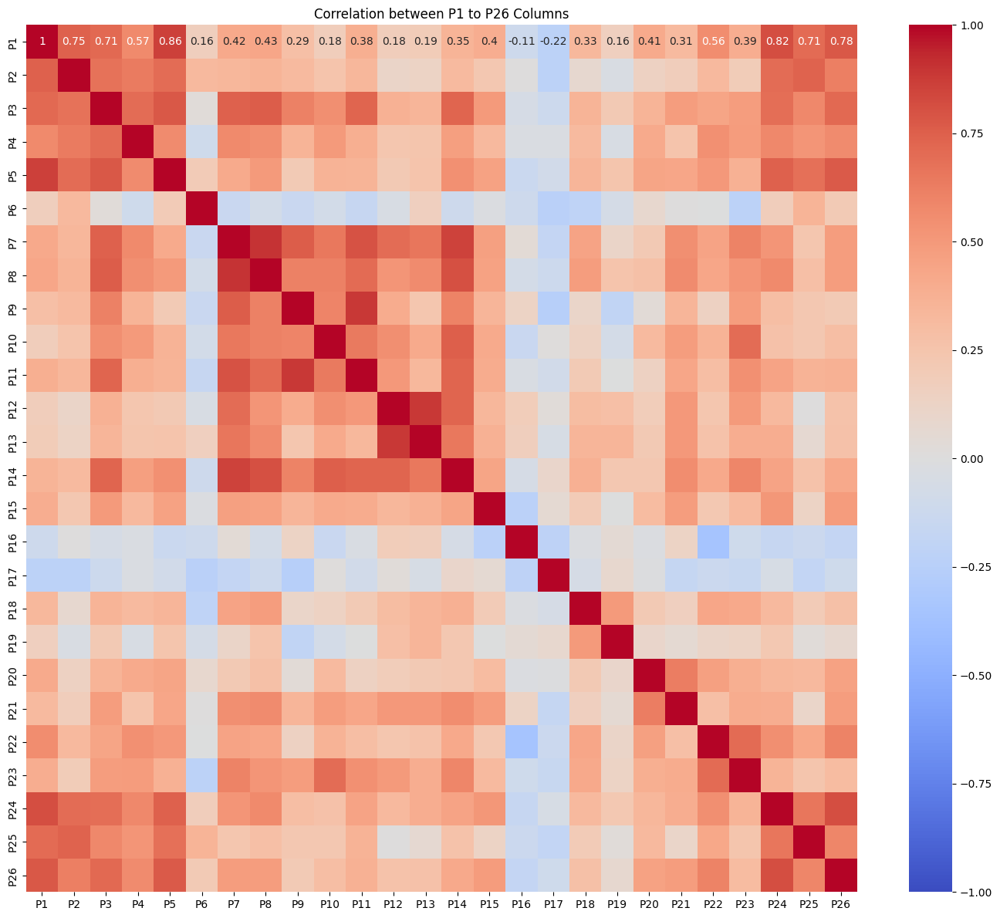

In [53]:
# P1부터 P26까지의 컬럼 선택
p_columns = [f'P{i}' for i in range(1, 27)]

# P1부터 P26까지의 상관관계 계산
correlation_matrix_p = filtered_data[p_columns].corr()

# 히트맵 생성
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix_p, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation between P1 to P26 Columns')
plt.tight_layout()
plt.show()
#p17은 고인물

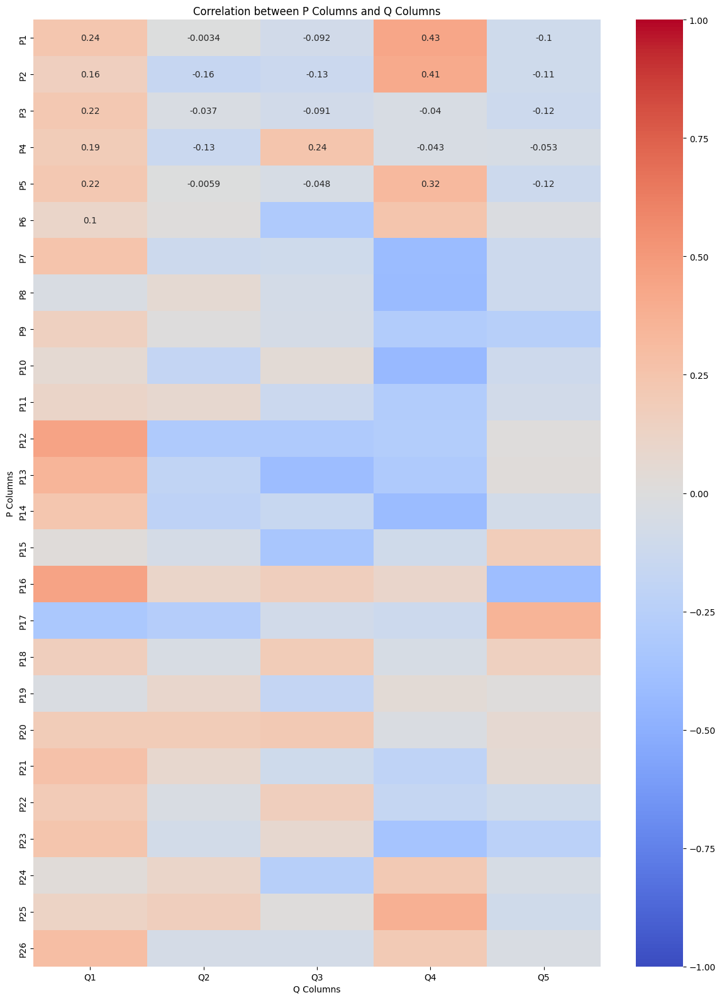

가장 높은 상관관계를 가진 P-Q 쌍 5개:
P16 - Q1: 0.4527
P12 - Q1: 0.4466
P10 - Q4: -0.4342
P1 - Q4: 0.4312
P8 - Q4: -0.4229


In [54]:
# P1부터 P26까지의 컬럼과 Q1부터 Q5까지의 컬럼 선택
p_columns = [f'P{i}' for i in range(1, 27)]
q_columns = [f'Q{i}' for i in range(1, 6)]

# P 컬럼들과 Q 컬럼들 간의 상관관계 계산
correlation_matrix_pq = filtered_data[p_columns + q_columns].corr().loc[p_columns, q_columns]

# 히트맵 생성
plt.figure(figsize=(12, 16))
sns.heatmap(correlation_matrix_pq, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation between P Columns and Q Columns')
plt.xlabel('Q Columns')
plt.ylabel('P Columns')
plt.tight_layout()
plt.show()

# 가장 높은 상관관계를 가진 P-Q 쌍 5개 출력
correlation_pairs = []
for p in p_columns:
    for q in q_columns:
        correlation_pairs.append((p, q, correlation_matrix_pq.loc[p, q]))

top_5_correlations = sorted(correlation_pairs, key=lambda x: abs(x[2]), reverse=True)[:5]

print("가장 높은 상관관계를 가진 P-Q 쌍 5개:")
for p, q, corr in top_5_correlations:
    print(f"{p} - {q}: {corr:.4f}")

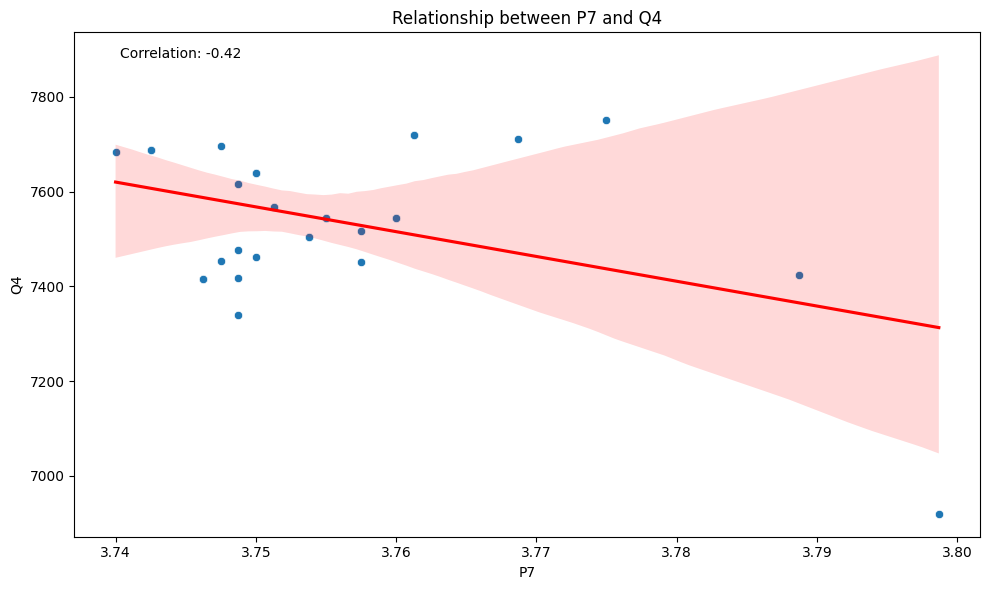

P7와 Q4의 상관계수: -0.4153

기술 통계:
              P7           Q4
count  30.000000    30.000000
mean    3.755537  7538.800000
std     0.012912   162.650758
min     3.740000  6920.000000
25%     3.748700  7455.000000
50%     3.751300  7544.000000
75%     3.759375  7672.000000
max     3.798700  7752.000000


In [55]:
# 산점도 생성
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x='P7', y='Q4')

# 회귀선 추가
sns.regplot(data=filtered_data, x='P7', y='Q4', scatter=False, color='red')

# 그래프 제목과 축 레이블 설정
plt.title('Relationship between P7 and Q4')
plt.xlabel('P7')
plt.ylabel('Q4')

# 상관계수 계산 및 표시
correlation = filtered_data['P7'].corr(filtered_data['Q4'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes)

plt.tight_layout()
plt.show()

# 추가적인 통계 정보 출력
print(f"P7와 Q4의 상관계수: {correlation:.4f}")
print("\n기술 통계:")
print(filtered_data[['P7', 'Q4']].describe())

## 전체 데이터의 경우

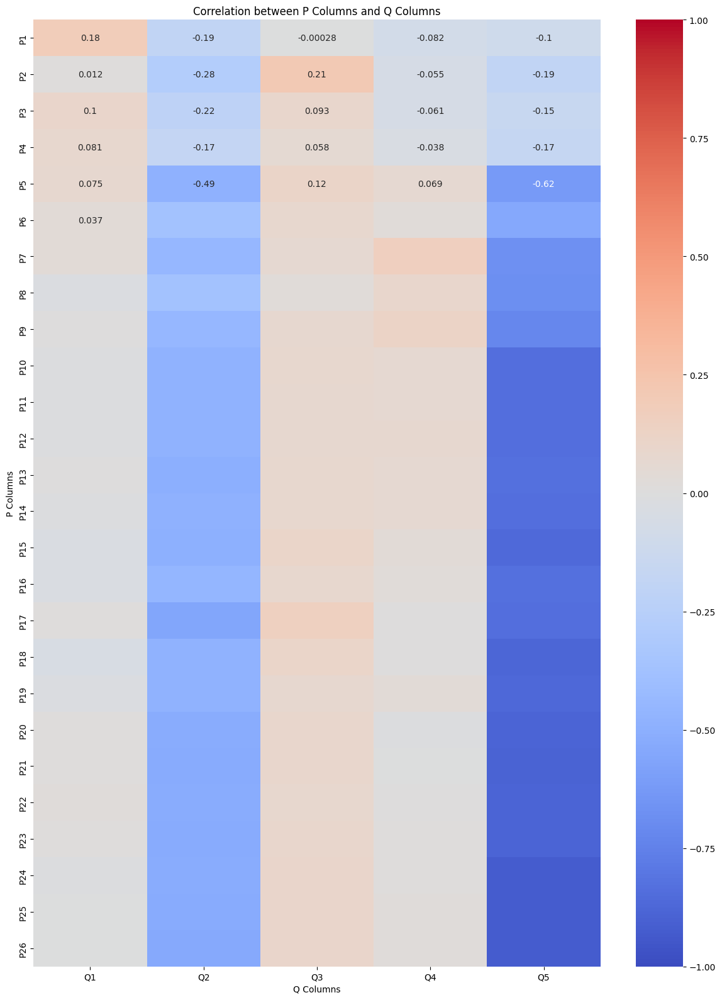

가장 높은 상관관계를 가진 P-Q 쌍 5개:
P24 - Q5: -0.9269
P26 - Q5: -0.9243
P25 - Q5: -0.9240
P21 - Q5: -0.8932
P23 - Q5: -0.8905


In [56]:
# P1부터 P26까지의 컬럼과 Q1부터 Q5까지의 컬럼 선택
p_columns = [f'P{i}' for i in range(1, 27)]
q_columns = [f'Q{i}' for i in range(1, 6)]

# P 컬럼들과 Q 컬럼들 간의 상관관계 계산
correlation_matrix_pq = df_A[p_columns + q_columns].corr().loc[p_columns, q_columns]

# 히트맵 생성
plt.figure(figsize=(12, 16))
sns.heatmap(correlation_matrix_pq, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation between P Columns and Q Columns')
plt.xlabel('Q Columns')
plt.ylabel('P Columns')
plt.tight_layout()
plt.show()

# 가장 높은 상관관계를 가진 P-Q 쌍 5개 출력
correlation_pairs = []
for p in p_columns:
    for q in q_columns:
        correlation_pairs.append((p, q, correlation_matrix_pq.loc[p, q]))

top_5_correlations = sorted(correlation_pairs, key=lambda x: abs(x[2]), reverse=True)[:5]

print("가장 높은 상관관계를 가진 P-Q 쌍 5개:")
for p, q, corr in top_5_correlations:
    print(f"{p} - {q}: {corr:.4f}")